In [2]:
import numpy as np
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from skimage.morphology import remove_small_objects, binary_closing, disk
from skimage.feature.texture import graycomatrix, graycoprops
from rasterio.mask import geometry_mask
import os
import glob
import re

In [50]:
# Define the directories containing images and shapefiles
image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_images"
shapefile_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_train"
unlabeled_image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_unlabeled"
new_walrus_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\walrus_shapefiles"

# Use glob to list all .tif and .shp files in the specified directories
image_paths = glob.glob(f"{image_dir}/*.tif")
shapefile_paths = glob.glob(f"{shapefile_dir}/*.shp")
unlabeled_image_paths = glob.glob(f"{unlabeled_image_dir}/*.tif")
new_walrus_paths = glob.glob(f"{new_walrus_dir}/*.shp")

# Function to extract island name and date from file names
def extract_island_and_date(filename):
    pattern = r'([a-zA-Z]+)_(\d{8})'
    match = re.search(pattern, filename)
    if match:
        return match.group(1), match.group(2)
    return None, None

# Pair image and shapefile paths based on filenames
def pair_files(image_paths, shapefile_paths):
    file_pairs = {}
    for image_path in image_paths:
        island, date = extract_island_and_date(os.path.basename(image_path))
        if island is None or date is None:
            print(f"Failed to extract island and date from {image_path}")
            continue

        matching_shapefiles = [shapefile for shapefile in shapefile_paths if island in shapefile and date in shapefile]
        if not matching_shapefiles:
            print(f"No matching shapefile found for {image_path}")
            continue

        shapefile_path = matching_shapefiles[0]
        file_pairs[image_path] = shapefile_path
    return file_pairs

file_pairs = pair_files(image_paths, shapefile_paths)

No matching shapefile found for C:\Users\Student\Documents\101_walrus_data\train\clipped_images\pool_20230803_image.tif


In [51]:
# Pair new walrus images with existing images
def pair_walrus_files(new_walrus_paths, image_paths):
    for walrus_path in new_walrus_paths:
        island, date = extract_island_and_date(os.path.basename(walrus_path))
        if island is None or date is None:
            print(f"Failed to extract island and date from {walrus_path}")
            continue

        matching_images = [image for image in image_paths if island in image and date in image]
        if not matching_images:
            print(f"No matching image found for {walrus_path}")
            continue

        image_path = matching_images[0]
        file_pairs[image_path] = walrus_path

pair_walrus_files(new_walrus_paths, image_paths + unlabeled_image_paths)

# Function to extract spectral signatures for walrus
def extract_walrus_spectral_signatures(image_path, shapefile_path):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    walrus_pixels = []

    for _, row in gdf.iterrows():
        if row['label'] in ['walrus_pure', 'walrus_mixed']:
            mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
            walrus_pixels.append(image[:, mask])

    if walrus_pixels:
        walrus_pixels = np.concatenate(walrus_pixels, axis=1)
        walrus_spectral_signature = np.mean(walrus_pixels, axis=1)
        return walrus_spectral_signature
    else:
        return None

# Loop through the image-shapefile pairs to compute the spectral signature
all_walrus_signatures = []

for image_path, shapefile_path in file_pairs.items():
    signature = extract_walrus_spectral_signatures(image_path, shapefile_path)
    if signature is not None:
        all_walrus_signatures.append(signature)

if all_walrus_signatures:
    walrus_spectral_signature = np.mean(all_walrus_signatures, axis=0)
    print(f"Computed walrus spectral signature: {walrus_spectral_signature}")
else:
    raise ValueError("No walrus pixels found in the provided images and shapefiles.")

# Function to extract additional features for walrus detection
def extract_additional_features(image):
    # Convert to grayscale for texture analysis
    gray_image = np.mean(image[:3], axis=0)

    # Ensure the input to LBP is 2-dimensional
    if gray_image.ndim != 2:
        raise ValueError(f"The parameter `image` must be a 2-dimensional array, but got {gray_image.ndim}-dimensional array.")

    # Local Binary Pattern
    lbp = local_binary_pattern(gray_image, P=8, R=1, method='uniform')
    
    # GLCM features
    glcm = graycomatrix(gray_image.astype(np.uint8), [1], [0, np.pi/4, np.pi/2, 3*np.pi/4], symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast').ravel()
    dissimilarity = graycoprops(glcm, 'dissimilarity').ravel()
    homogeneity = graycoprops(glcm, 'homogeneity').ravel()
    energy = graycoprops(glcm, 'energy').ravel()
    correlation = graycoprops(glcm, 'correlation').ravel()

    # Combine all features
    additional_features = np.concatenate([
        lbp.ravel(),
        contrast, dissimilarity, homogeneity, energy, correlation
    ])

    return additional_features

# Function to extract features and labels
def extract_features_labels(image_path, shapefile_path, walrus_spectral_signature):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    walrus_spectral_signature_flattened = walrus_spectral_signature.flatten()

    for _, row in gdf.iterrows():
        mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
        feature_pixels = image[:, mask]
        label = row['label']

        if label == 'ocean':
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Ocean label
        elif label in ['walrus_pure', 'walrus_mixed']:
            for pixel in feature_pixels.T:
                combined_features = np.concatenate([pixel, walrus_spectral_signature_flattened])
                if combined_features.shape[0] == len(pixel) + len(walrus_spectral_signature_flattened):
                    features.append(combined_features)
                    labels.append(2)  # Walrus label (combining pure and mixed)
                else:
                    print(f"Skipping pixel due to shape mismatch: {pixel.shape} and {walrus_spectral_signature_flattened.shape}")
        elif label in ['rock', 'ice', 'freshwater']:
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Non-ocean, non-walrus label
        else:
            print(f"Warning: Unexpected label '{label}' encountered. Skipping.")

    return np.array(features), np.array(labels)

# Extract features and labels for all image-shapefile pairs
def get_dataset(file_pairs, walrus_spectral_signature):
    features = []
    labels = []

    for image_path, shapefile_path in file_pairs.items():
        img_features, img_labels = extract_features_labels(image_path, shapefile_path, walrus_spectral_signature)
        features.append(img_features)
        labels.append(img_labels)

    if not features or not labels:
        raise ValueError("No features or labels were extracted.")

    features = np.vstack(features)
    labels = np.hstack(labels)
    return features, labels

features, labels = get_dataset(file_pairs, walrus_spectral_signature)

Computed walrus spectral signature: [1168.9384828  1043.34314089 1256.17040723 1209.64452459 1460.1650702
 1295.17030128 1400.49245205 1631.28937376]


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (186702,) + inhomogeneous part.

In [ ]:
# Train a Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(features, labels)

In [ ]:
# Train a Gradient Boosting model
gb_model = GradientBoostingClassifier(n_estimators= , random_state=42)
gb_model.fit(features, labels)

# Evaluate the models
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    print("\nConfusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

print("Random Forest Model Evaluation:")
evaluate_model(rf_model, features, labels)

print("\nGradient Boosting Model Evaluation:")
evaluate_model(gb_model, features, labels)

# Post-processing function to remove small isolated regions
def post_process_mask(mask, min_size=300):
    cleaned_mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    cleaned_mask = binary_closing(cleaned_mask, disk(radius=2))
    return cleaned_mask

def plot_masks(image_path, rf_model, gb_model, walrus_spectral_signature):
    with rasterio.open(image_path) as src:
        image = src.read()
        height, width = image.shape[1], image.shape[2]
        
        # Process the image in chunks
        chunk_size = 200  # Adjust this value based on your available memory
        predictions = np.zeros((height, width), dtype=np.float32)
        
        walrus_spectral_signature_flattened = walrus_spectral_signature.flatten()

        for y in range(0, height, chunk_size):
            for x in range(0, width, chunk_size):
                chunk = image[:, y:min(y+chunk_size, height), x:min(x+chunk_size, width)]
                chunk_features = np.hstack([chunk.T, np.tile(walrus_spectral_signature_flattened, (chunk.shape[1], 1))])
                
                # Ensure that chunk_features has the same number of features as used in training
                if chunk_features.shape[1] != rf_model.n_features_in_:
                    chunk_features = chunk_features[:, :rf_model.n_features_in_]
                
                rf_pred = rf_model.predict(chunk_features)
                gb_pred = gb_model.predict(chunk_features)
                
                # Ensemble prediction
                chunk_predictions = (rf_pred + gb_pred) / 2
                predictions[y:y+chunk_size, x:x+chunk_size] = chunk_predictions.reshape(chunk.shape[1], chunk.shape[2])
        
        # Post-process the masks
        ocean_mask = post_process_mask(predictions == 1)
        walrus_mask = post_process_mask(predictions == 2, min_size=2)  # Smaller min_size for walrus

        plt.figure(figsize=(16, 8))
        plt.subplot(2, 2, 1)
        plt.title("Original Image (RGB Composite)")
        rgb_composite = np.dstack((image[5], image[3], image[1]))  # Red: Band 6, Green: Band 4, Blue: Band 2
        rgb_composite = np.clip(rgb_composite / np.percentile(rgb_composite, 98), 0, 1)  # Adjust brightness
        plt.imshow(rgb_composite)
        
        plt.subplot(2, 2, 2)
        plt.title("Ocean Mask")
        plt.imshow(ocean_mask, cmap='Blues')
        
        plt.subplot(2, 2, 3)
        plt.title("Walrus Mask")
        plt.imshow(walrus_mask, cmap='Reds')
        
        plt.subplot(2, 2, 4)
        plt.title("Combined Mask")
        combined_mask = np.zeros_like(ocean_mask, dtype=np.uint8)
        combined_mask[ocean_mask] = 1
        combined_mask[walrus_mask] = 2
        plt.imshow(combined_mask, cmap='viridis')
        
        plt.tight_layout()
        plt.show()

# Plot predictions for training images
for image_path in image_paths:
    plot_masks(image_path, rf_model, gb_model, walrus_spectral_signature)

def plot_prediction(image_path, rf_model, gb_model, walrus_spectral_signature):
    with rasterio.open(image_path) as src:
        image = src.read()
        height, width = image.shape[1], image.shape[2]
        
        # Process the image in chunks
        chunk_size = 200  # Adjust this value based on your available memory
        predictions = np.zeros((height, width), dtype=np.float32)
        
        walrus_spectral_signature_flattened = walrus_spectral_signature.flatten()

        for y in range(0, height, chunk_size):
            for x in range(0, width, chunk_size):
                chunk = image[:, y:min(y+chunk_size, height), x:min(x+chunk_size, width)]
                chunk_features = np.hstack([chunk.T, np.tile(walrus_spectral_signature_flattened, (chunk.shape[1], 1))])
                
                # Ensure that chunk_features has the same number of features as used in training
                if chunk_features.shape[1] != rf_model.n_features_in_:
                    chunk_features = chunk_features[:, :rf_model.n_features_in_]
                
                rf_pred = rf_model.predict(chunk_features)
                gb_pred = gb_model.predict(chunk_features)
                
                # Ensemble prediction
                chunk_predictions = (rf_pred + gb_pred) / 2
                predictions[y:y+chunk_size, x:x+chunk_size] = chunk_predictions.reshape(chunk.shape[1], chunk.shape[2])
        
        # Post-process the masks
        ocean_mask = post_process_mask(predictions == 1)
        walrus_mask = post_process_mask(predictions == 2, min_size=5)  # Smaller min_size for walrus

        plt.figure(figsize=(16, 8))
        plt.subplot(2, 2, 1)
        plt.title("Original Image (RGB Composite)")
        rgb_composite = np.dstack((image[5], image[3], image[1]))  # Red: Band 6, Green: Band 4, Blue: Band 2
        rgb_composite = np.clip(rgb_composite / np.percentile(rgb_composite, 98), 0, 1)  # Adjust brightness
        plt.imshow(rgb_composite)
        
        plt.subplot(2, 2, 2)
        plt.title("Ocean Mask")
        plt.imshow(ocean_mask, cmap='Blues')
        
        plt.subplot(2, 2, 3)
        plt.title("Walrus Mask")
        plt.imshow(walrus_mask, cmap='Reds')
        
        plt.subplot(2, 2, 4)
        plt.title("Combined Mask")
        combined_mask = np.zeros_like(ocean_mask, dtype=np.uint8)
        combined_mask[ocean_mask] = 1
        combined_mask[walrus_mask] = 2
        plt.imshow(combined_mask, cmap='viridis')
        
        plt.tight_layout()
        plt.show()

    return predictions

# Plot predictions for unlabeled images
for image_path in unlabeled_image_paths:
    print(f"Processing image: {os.path.basename(image_path)}")
    predictions = plot_prediction(image_path, rf_model, gb_model, walrus_spectral_signature)


In [10]:
import joblib
from sklearn.preprocessing import LabelEncoder
import glob
import os
import re
import numpy as np
import pandas as pd
import rasterio
import geopandas as gpd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from scipy.ndimage import label, binary_dilation
from rasterio.features import geometry_mask
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, \
    classification_report, confusion_matrix
import seaborn as sns
import joblib
import rasterio
import geopandas as gpd
from rasterio.features import geometry_mask
from scipy.ndimage import binary_dilation, binary_erosion, label, generate_binary_structure
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.ndimage import binary_dilation, binary_erosion, label, generate_binary_structure

ImportError: cannot import name 'geometry_mas' from 'rasterio.features' (C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\rasterio\features.py)

In [11]:
# Define the directories containing images and shapefiles
image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_images"
shapefile_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_train"
unlabeled_image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_unlabeled"
new_walrus_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\walrus_shapefiles"

# Use glob to list all .tif and .shp files in the specified directories
image_paths = glob.glob(f"{image_dir}/*.tif")
shapefile_paths = glob.glob(f"{shapefile_dir}/*.shp")
unlabeled_image_paths = glob.glob(f"{unlabeled_image_dir}/*.tif")
new_walrus_paths = glob.glob(f"{new_walrus_dir}/*.shp")

# Function to extract island name and date from file names
def extract_island_and_date(filename):
    pattern = r'([a-zA-Z]+)_(\d{8})'
    match = re.search(pattern, filename)
    if match:
        return match.group(1), match.group(2)
    return None, None


all_image_paths = image_paths + unlabeled_image_paths

def pair_training_files(image_paths, shapefile_paths):
    training_pairs = {}
    for image_path in image_paths:
        island, date = extract_island_and_date(os.path.basename(image_path))
        if island is None or date is None:
            print(f"Failed to extract island and date from {image_path}")
            continue

        matching_shapefiles = [shapefile for shapefile in shapefile_paths if island in shapefile and date in shapefile]
        if matching_shapefiles:
            training_pairs[image_path] = matching_shapefiles[0]

    return training_pairs


def pair_validation_files(unlabeled_image_paths, walrus_paths):
    validation_pairs = {}
    for image_path in unlabeled_image_paths:
        island, date = extract_island_and_date(os.path.basename(image_path))
        if island is None or date is None:
            print(f"Failed to extract island and date from {image_path}")
            continue

        matching_walrus = [walrus for walrus in walrus_paths if island in walrus and date in walrus]
        if matching_walrus:
            validation_pairs[image_path] = matching_walrus[0]
        else:
            validation_pairs[image_path] = None  # Include images without walrus shapefiles

    return validation_pairs


training_pairs = pair_training_files(image_paths, shapefile_paths)
validation_pairs = pair_validation_files(unlabeled_image_paths, new_walrus_paths)


def extract_features_labels(image_path, general_shapefile, walrus_shapefile):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    features = []
    labels = []
    img_name = []

    # Process general shapefile
    if general_shapefile:
        gdf = gpd.read_file(general_shapefile)
        for _, row in gdf.iterrows():
            mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
            feature_pixels = image[:, mask]
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(row['label'])
                img_name.append(image_path)

    # Process walrus shapefile
    if walrus_shapefile:
        gdf = gpd.read_file(walrus_shapefile)
        for _, row in gdf.iterrows():
            mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
            feature_pixels = image[:, mask]
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(row['label'])
                img_name.append(image_path)

    features, labels, img_name = np.array(features), np.array(labels), np.array(img_name)

    # Debugging print statements
    print(f"Extracted {features.shape[0]} features, {labels.shape[0]} labels from {image_path}")

    return features, labels, img_name


def get_dataset(file_pairs):
    features = []
    labels = []
    image_name = []

    for image_path, shapefile in file_pairs.items():
        img_features, img_labels, img_name = extract_features_labels(image_path, shapefile, None)
        if img_features.size > 0:
            features.append(img_features)
            labels.append(img_labels)
            image_name.append(img_name)

    if features and labels:
        features = np.vstack(features)
        labels = np.hstack(labels)
        image_name = np.hstack(image_name)
    else:
        features = np.array(features)
        labels = np.array(labels)
        image_name = np.array(image_name)

    print(f"Total features: {features.shape}, Total labels: {labels.shape}, Total image names: {image_name.shape}")

    return features, labels, image_name


features, labels, image_name = get_dataset(training_pairs)

# Encode labels
le = LabelEncoder()
encoded_labels = le.fit_transform(labels)

# Create DataFrame
dataset = pd.DataFrame({
    'Coast_blue': features[:, 0],
    'Blue': features[:, 1],
    'Green1': features[:, 2],
    'Green': features[:, 3],
    'Yellow': features[:, 4],
    'Red': features[:, 5],
    'Red_edge': features[:, 6],
    'NIR': features[:, 7],
    'labels': labels,
    'encoded_labels': encoded_labels,
    'image_name': image_name
})

Extracted 118050 features, 118050 labels from C:\Users\Student\Documents\101_walrus_data\train\clipped_images\buch_20230714_image.tif
Extracted 186702 features, 186702 labels from C:\Users\Student\Documents\101_walrus_data\train\clipped_images\buch_20230720_image.tif
Extracted 174450 features, 174450 labels from C:\Users\Student\Documents\101_walrus_data\train\clipped_images\buch_20230731_image.tif
Extracted 74527 features, 74527 labels from C:\Users\Student\Documents\101_walrus_data\train\clipped_images\buch_20230923_image.tif
Extracted 67507 features, 67507 labels from C:\Users\Student\Documents\101_walrus_data\train\clipped_images\moff_20230717_image.tif
Extracted 63726 features, 63726 labels from C:\Users\Student\Documents\101_walrus_data\train\clipped_images\pal_20230714_image.tif
Extracted 28744 features, 28744 labels from C:\Users\Student\Documents\101_walrus_data\train\clipped_images\pal_20230720_image.tif
Extracted 78019 features, 78019 labels from C:\Users\Student\Documents\1

In [12]:
# Function to extract additional features for walrus detection
def extract_additional_features(image):
    # Convert to grayscale for texture analysis
    gray_image = np.mean(image[:3], axis=0)

    # Ensure the input to LBP is 2-dimensional
    if gray_image.ndim != 2:
        raise ValueError(f"The parameter `image` must be a 2-dimensional array, but got {gray_image.ndim}-dimensional array.")

    # Local Binary Pattern
    lbp = local_binary_pattern(gray_image, P=8, R=1, method='uniform')
    
    # GLCM features
    glcm = graycomatrix(gray_image.astype(np.uint8), [1], [0, np.pi/4, np.pi/2, 3*np.pi/4], symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast').ravel()
    dissimilarity = graycoprops(glcm, 'dissimilarity').ravel()
    homogeneity = graycoprops(glcm, 'homogeneity').ravel()
    energy = graycoprops(glcm, 'energy').ravel()
    correlation = graycoprops(glcm, 'correlation').ravel()

    # Combine all features
    additional_features = np.concatenate([
        lbp.ravel(),
        contrast, dissimilarity, homogeneity, energy, correlation
    ])

    return additional_features

# Function to extract features and labels
def extract_features_labels(image_path, shapefile_path):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    for _, row in gdf.iterrows():
        mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
        feature_pixels = image[:, mask]
        label = row['label']

        if label == 'ocean':
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Ocean label
        elif label in ['walrus_pure', 'walrus_mixed']:
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(2)  # Walrus label (combining pure and mixed)
        elif label in ['rock', 'ice', 'freshwater']:
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Non-ocean, non-walrus label
        else:
            print(f"Warning: Unexpected label '{label}' encountered. Skipping.")

    return np.array(features), np.array(labels)

In [13]:
# Ensure additional features are consistent during training
def add_additional_features(features):
    all_additional_features = []
    for feature_set in features:
        # Ensure feature_set is 2D
        if feature_set.ndim == 1:
            feature_set = feature_set.reshape(1, -1)
        
        # Transpose only if necessary
        if feature_set.shape[0] > feature_set.shape[1]:
            feature_set = feature_set.T
        
        # Extract additional features
        additional_features = extract_additional_features(feature_set)
        
        # Ensure additional_features has the same number of rows as feature_set
        if additional_features.shape[0] != feature_set.shape[1]:
            additional_features = np.tile(additional_features, (feature_set.shape[1], 1))
        
        all_additional_features.append(additional_features)
    
    all_additional_features = np.vstack(all_additional_features)
    return np.hstack([features, all_additional_features])

In [14]:
def extract_additional_features(image):
    # Ensure image is at least 2D
    if image.ndim == 1:
        image = image.reshape(1, -1)
    
    # Convert to grayscale for texture analysis
    if image.shape[0] >= 3:
        gray_image = np.mean(image[:3], axis=0)
    else:
        gray_image = image[0]

    # Ensure the input to LBP is 2-dimensional
    if gray_image.ndim != 2:
        raise ValueError(f"The parameter `image` must be a 2-dimensional array, but got {gray_image.ndim}-dimensional array.")


In [16]:
from sklearn.model_selection import train_test_split

X = dataset.drop(['labels', 'encoded_labels', 'image_name'], axis=1)
y = dataset['encoded_labels']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [17]:
# Train a Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Save the Random Forest model
joblib.dump(rf_model, "random_forest_model_thisone.joblib")

['random_forest_model_thisone.joblib']

In [18]:
# Train a Gradient Boosting model
gb_model = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb_model.fit(X_train, y_train)

# Save the Gradient Boosting model
joblib.dump(gb_model, "gradient_boost_model_thisone.joblib")

['gradient_boost_model_thisone.joblib']

In [21]:
def extract_features(image_chunk):
    features = []
    # Flatten the image chunk to extract features for each pixel
    for band in image_chunk:
        features.append(band.ravel())
    features = np.array(features).T
    return features

Random Forest Model Evaluation:
Accuracy: 0.9889166773105019

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.87      0.90      7971
           1       0.97      0.99      0.98     59764
           2       1.00      1.00      1.00    156046
           3       0.98      0.97      0.98     18757
           4       0.89      0.23      0.36       149
           5       0.89      0.40      0.55        20

    accuracy                           0.99    242707
   macro avg       0.94      0.74      0.79    242707
weighted avg       0.99      0.99      0.99    242707


Confusion Matrix:
[[  6971    913     48     39      0      0]
 [   373  59160     83    148      0      0]
 [   106    153 155710     77      0      0]
 [   133    371    119  18134      0      0]
 [     4     84      2     24     34      1]
 [     0      4      1      3      4      8]]

Gradient Boosting Model Evaluation:
Accuracy: 0.9718467122909517

Classification 

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

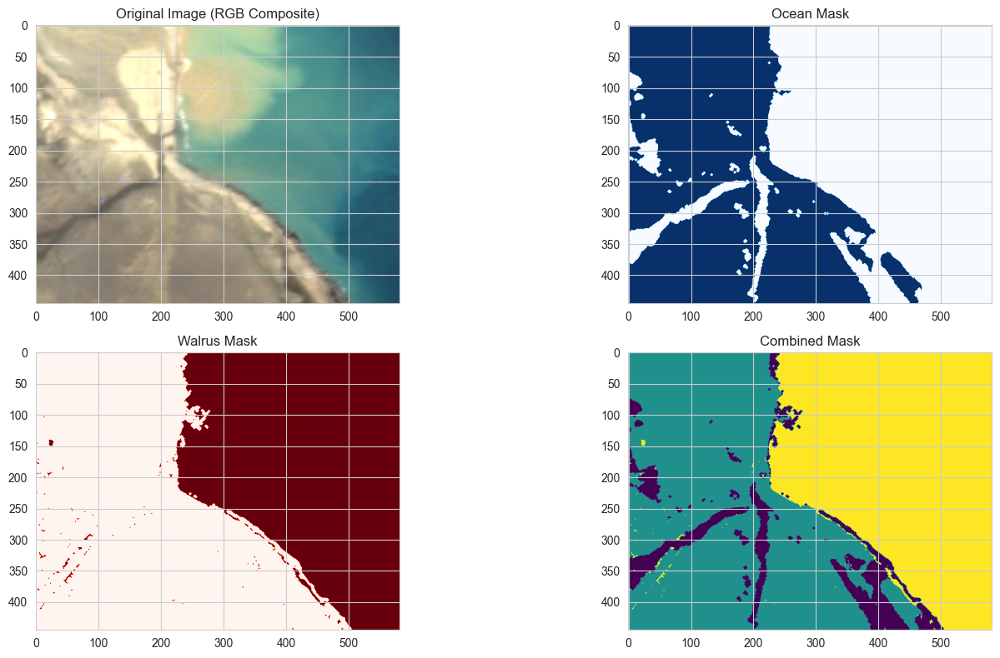

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

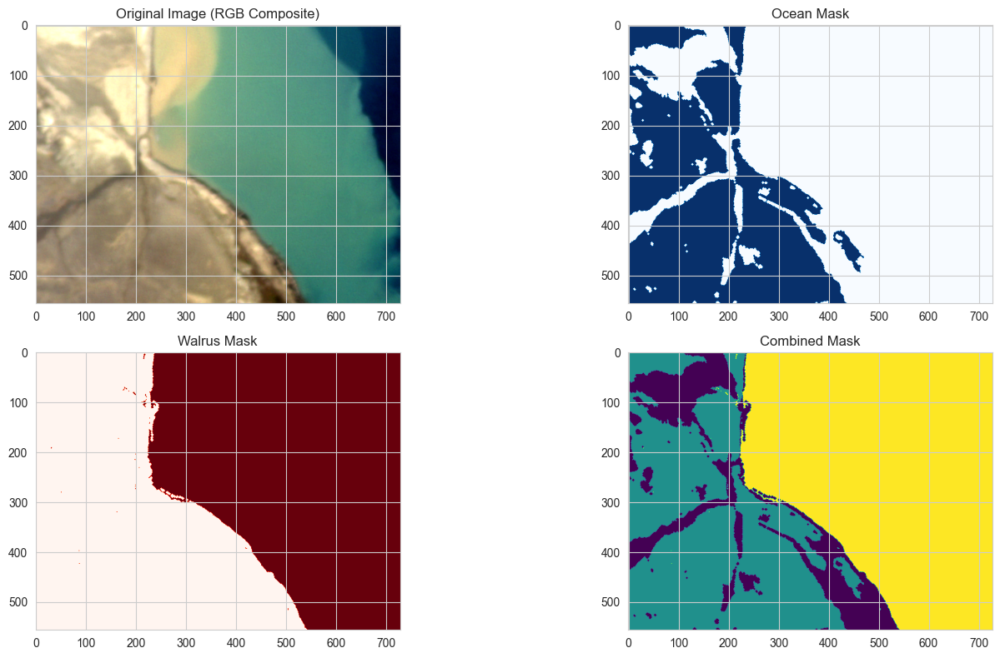

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

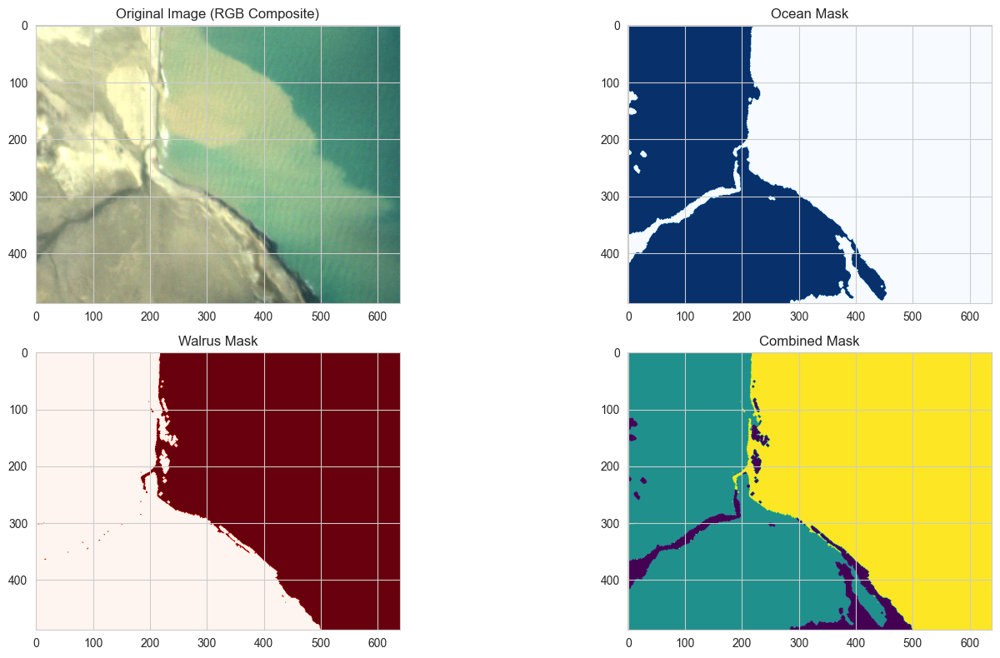

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

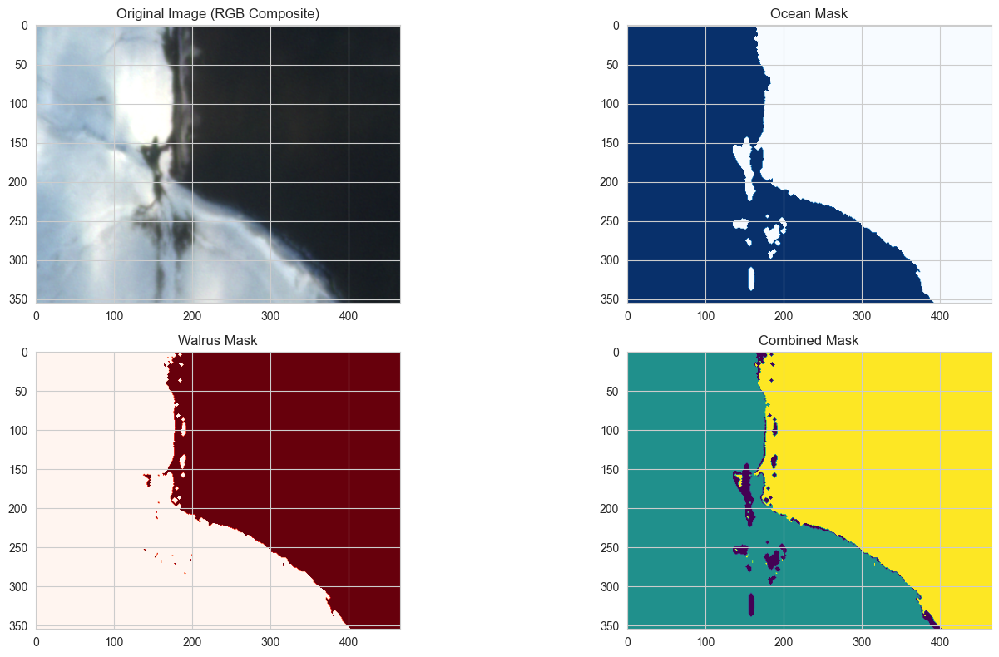

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

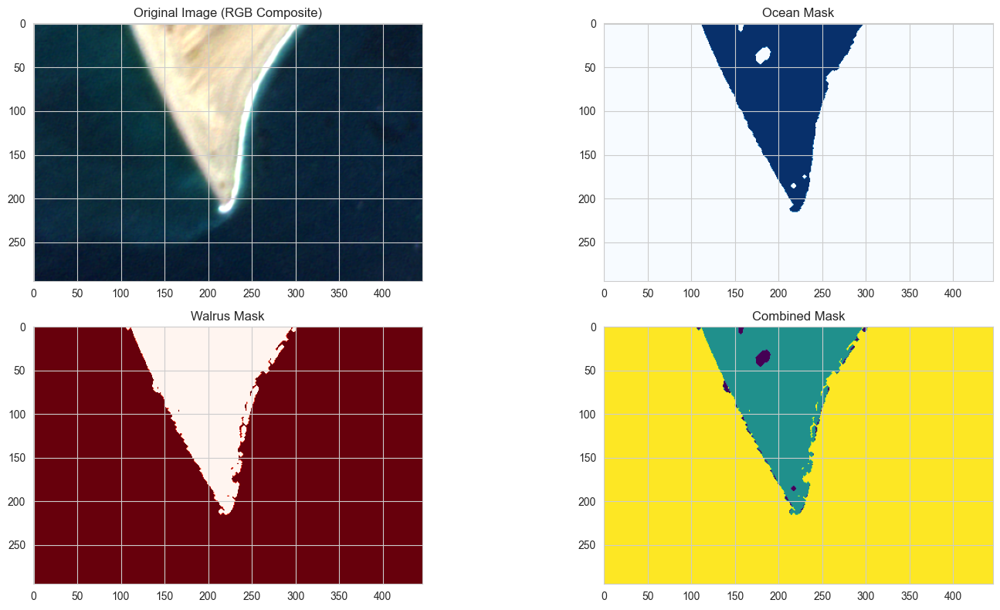

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

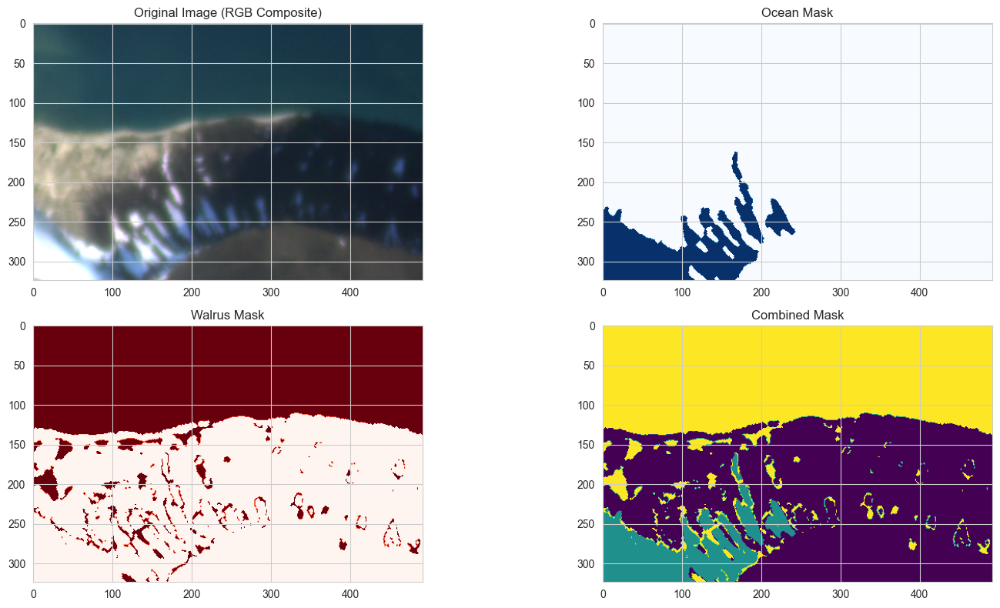

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

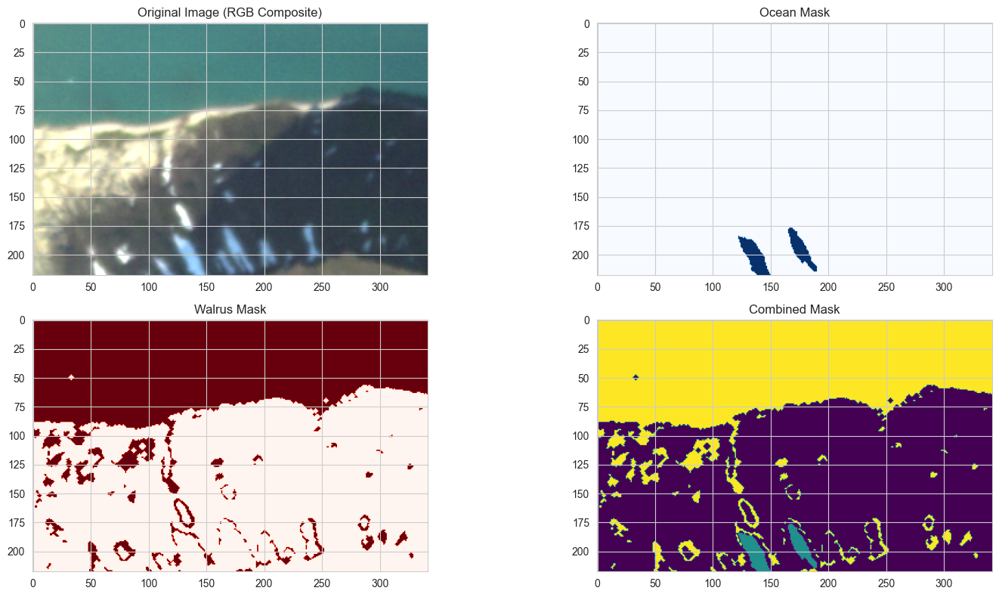

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

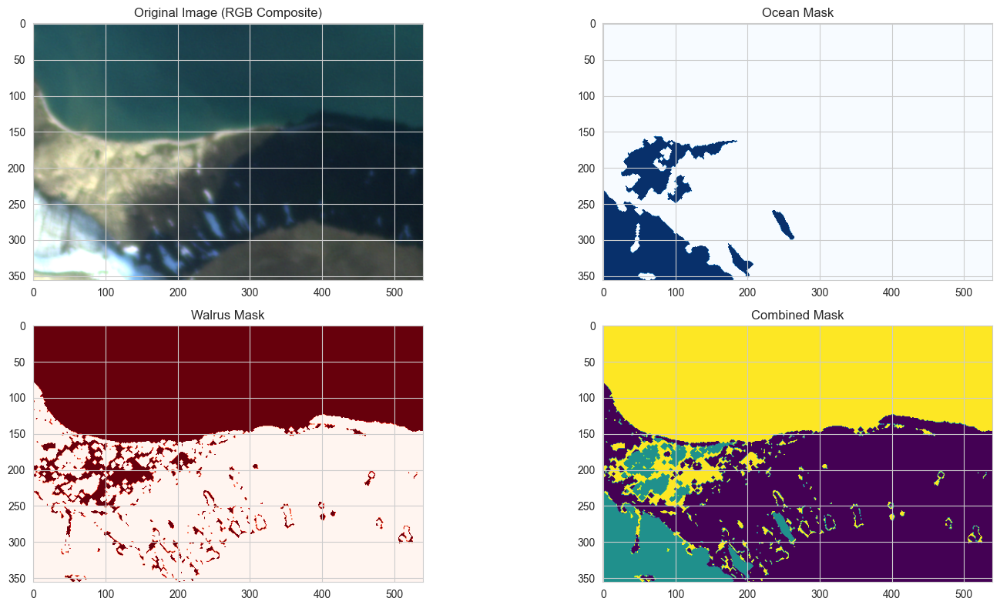

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

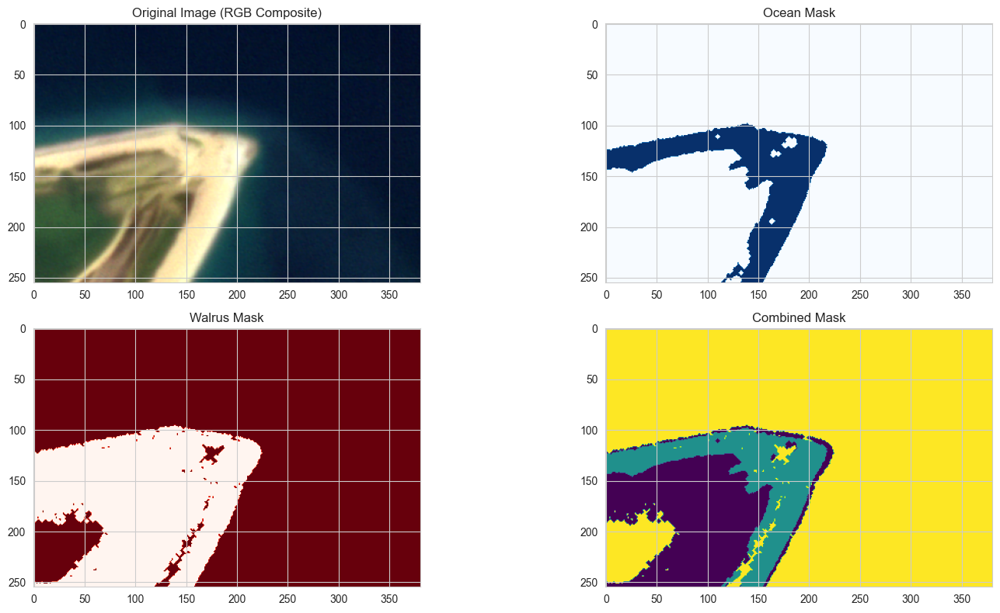

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

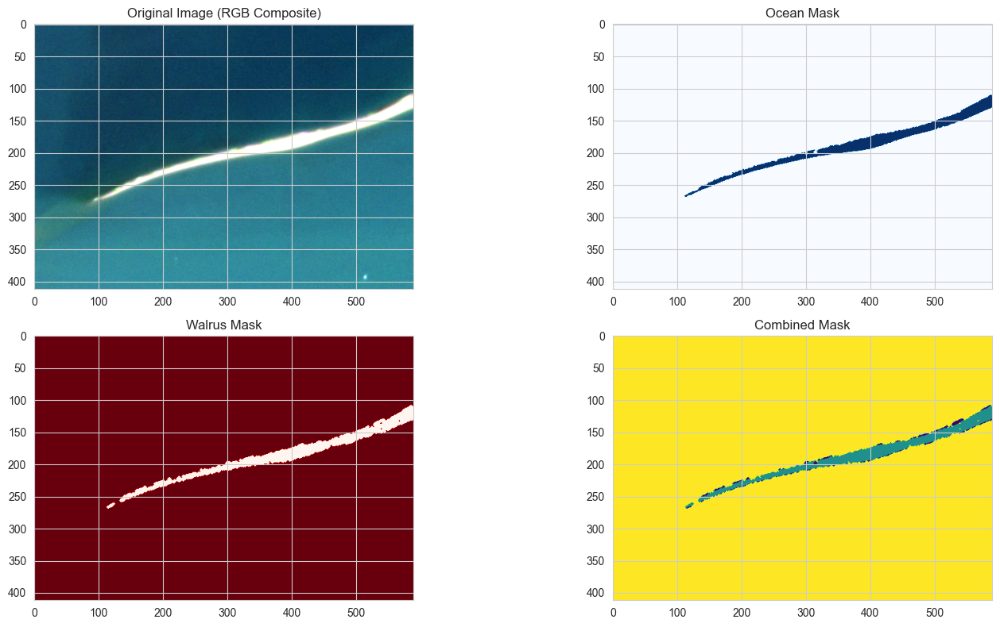

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

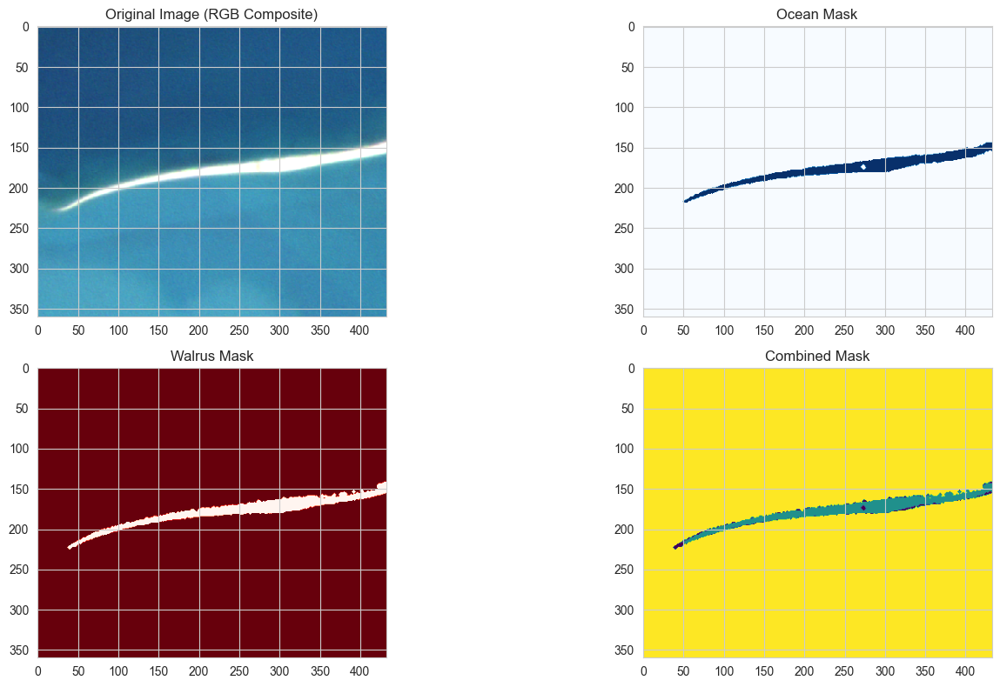

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

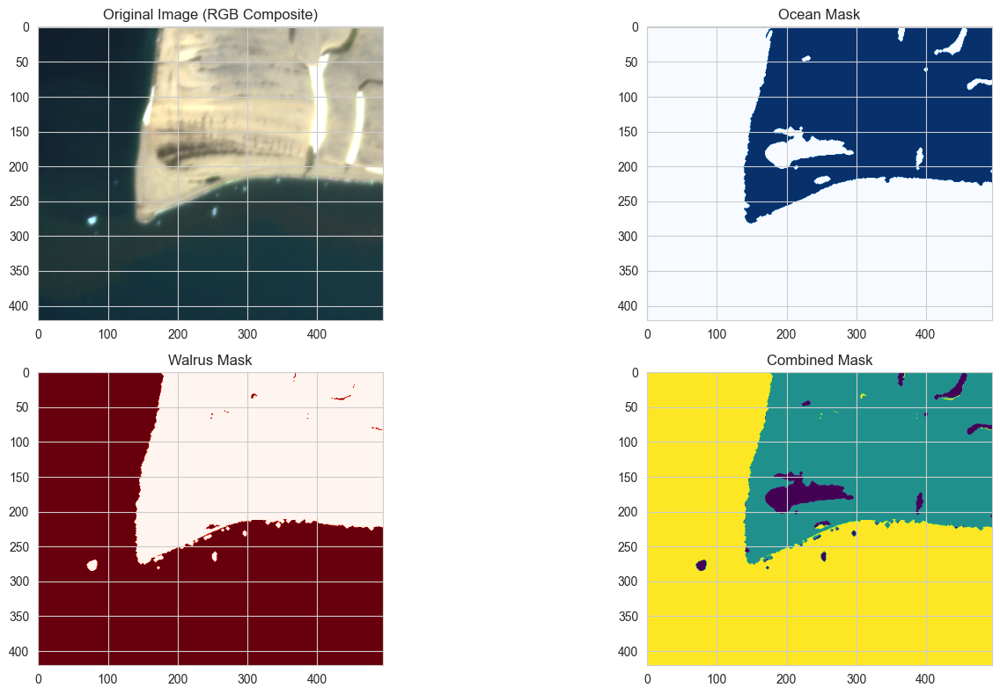

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

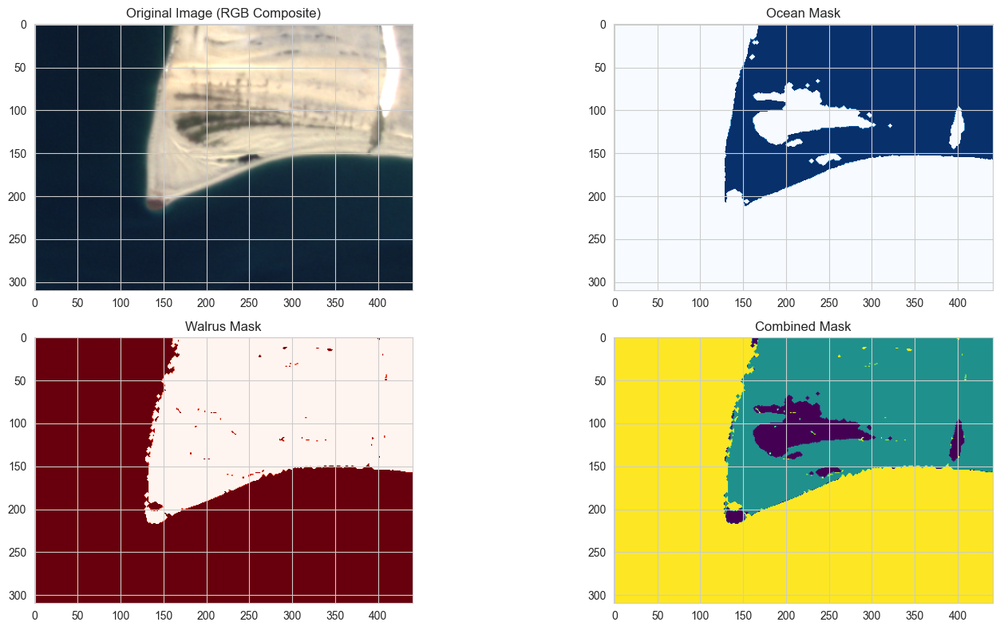

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

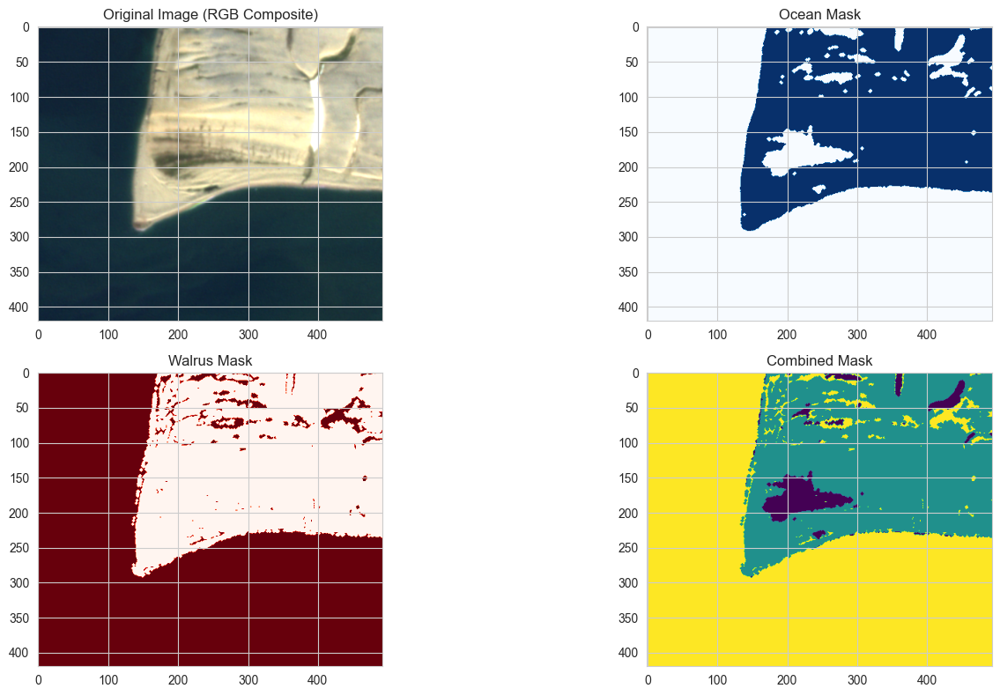

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier

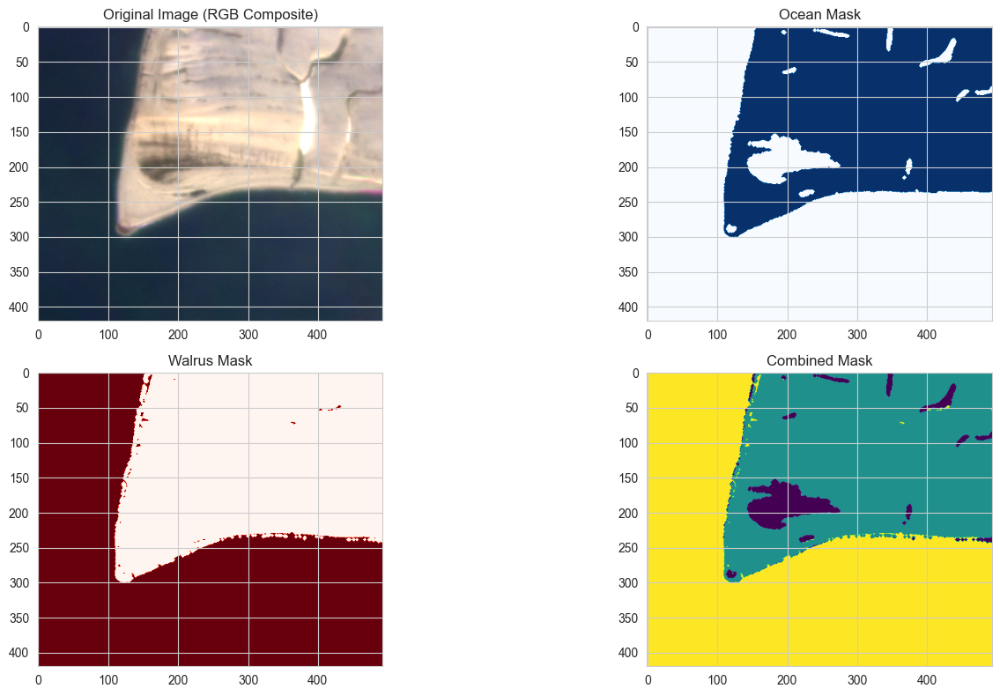

In [22]:
# Evaluate the models
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    print("\nConfusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

print("Random Forest Model Evaluation:")
evaluate_model(rf_model, X_test, y_test)

print("\nGradient Boosting Model Evaluation:")
evaluate_model(gb_model, X_test, y_test)

# Post-processing function to remove small isolated regions
def post_process_mask(mask, min_size=300):
    cleaned_mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    cleaned_mask = binary_closing(cleaned_mask, disk(radius=2))
    return cleaned_mask

def plot_masks(image_path, rf_model, gb_model):
    with rasterio.open(image_path) as src:
        image = src.read()
        height, width = image.shape[1], image.shape[2]
        
        # Process the image in chunks
        chunk_size = 200  # Adjust this value based on your available memory
        predictions = np.zeros((height, width), dtype=np.float32)
        
        for y in range(0, height, chunk_size):
            for x in range(0, width, chunk_size):
                chunk = image[:, y:min(y+chunk_size, height), x:min(x+chunk_size, width)]
                chunk_features = extract_features(chunk)
                
                # Ensure that chunk_features has the same number of features as used in training
                if chunk_features.shape[1] != rf_model.n_features_in_:
                    print(f"Warning: Number of features mismatch. Expected {rf_model.n_features_in_}, got {chunk_features.shape[1]}.")
                    # You might need to adjust your feature extraction here
                    # For example, if you're extracting one extra feature, you could do:
                    # chunk_features = chunk_features[:, :rf_model.n_features_in_]
                
                rf_pred = rf_model.predict(chunk_features)
                gb_pred = gb_model.predict(chunk_features)
                
                # Ensemble prediction
                chunk_predictions = (rf_pred + gb_pred) / 2
                predictions[y:y+chunk_size, x:x+chunk_size] = chunk_predictions.reshape(chunk.shape[1], chunk.shape[2])
        
        # Rest of the function remains the same...
        
        # Post-process the masks
        ocean_mask = post_process_mask(predictions == 1)
        walrus_mask = post_process_mask(predictions == 2, min_size=2)  # Smaller min_size for walrus

        plt.figure(figsize=(16, 8))
        plt.subplot(2, 2, 1)
        plt.title("Original Image (RGB Composite)")
        rgb_composite = np.dstack((image[5], image[3], image[1]))  # Red: Band 6, Green: Band 4, Blue: Band 2
        rgb_composite = np.clip(rgb_composite / np.percentile(rgb_composite, 98), 0, 1)  # Adjust brightness
        plt.imshow(rgb_composite)
        
        plt.subplot(2, 2, 2)
        plt.title("Ocean Mask")
        plt.imshow(ocean_mask, cmap='Blues')
        
        plt.subplot(2, 2, 3)
        plt.title("Walrus Mask")
        plt.imshow(walrus_mask, cmap='Reds')
        
        plt.subplot(2, 2, 4)
        plt.title("Combined Mask")
        combined_mask = np.zeros_like(ocean_mask, dtype=np.uint8)
        combined_mask[ocean_mask] = 1
        combined_mask[walrus_mask] = 2
        plt.imshow(combined_mask, cmap='viridis')
        
        plt.tight_layout()
        plt.show()

# Plot predictions for training images
for image_path in image_paths:
    plot_masks(image_path, rf_model, gb_model)

In [20]:
def plot_prediction(image_path, rf_model, gb_model):
    with rasterio.open(image_path) as src:
        image = src.read()
        height, width = image.shape[1], image.shape[2]
        
        # Process the image in chunks
        chunk_size = 200  # Adjust this value based on your available memory
        predictions = np.zeros((height, width), dtype=np.float32)
        
        for y in range(0, height, chunk_size):
            for x in range(0, width, chunk_size):
                chunk = image[:, y:min(y+chunk_size, height), x:min(x+chunk_size, width)]
                chunk_features = extract_features(chunk)
                
                # Ensure that chunk_features has the same number of features as used in training
                if chunk_features.shape[1] != rf_model.n_features_in_:
                    chunk_features = chunk_features[:, :rf_model.n_features_in_]
                
                rf_pred = rf_model.predict(chunk_features)
                gb_pred = gb_model.predict(chunk_features)
                
                # Ensemble prediction
                chunk_predictions = (rf_pred + gb_pred) / 2
                predictions[y:y+chunk_size, x:x+chunk_size] = chunk_predictions.reshape(chunk.shape[1], chunk.shape[2])
        
        # Post-process the masks
        ocean_mask = post_process_mask(predictions == 1)
        walrus_mask = post_process_mask(predictions == 2, min_size=5)  # Smaller min_size for walrus

        plt.figure(figsize=(16, 8))
        plt.subplot(2, 2, 1)
        plt.title("Original Image (RGB Composite)")
        rgb_composite = np.dstack((image[5], image[3], image[1]))  # Red: Band 6, Green: Band 4, Blue: Band 2
        rgb_composite = np.clip(rgb_composite / np.percentile(rgb_composite, 98), 0, 1)  # Adjust brightness
        plt.imshow(rgb_composite)
        
        plt.subplot(2, 2, 2)
        plt.title("Ocean Mask")
        plt.imshow(ocean_mask, cmap='Blues')
        
        plt.subplot(2, 2, 3)
        plt.title("Walrus Mask")
        plt.imshow(walrus_mask, cmap='Reds')
        
        plt.subplot(2, 2, 4)
        plt.title("Combined Mask")
        combined_mask = np.zeros_like(ocean_mask, dtype=np.uint8)
        combined_mask[ocean_mask] = 1
        combined_mask[walrus_mask] = 2
        plt.imshow(combined_mask, cmap='viridis')
        
        plt.tight_layout()
        plt.show()

    return predictions


# Plot predictions for unlabeled images
for image_path in unlabeled_image_paths:
    print(f"Processing image: {os.path.basename(image_path)}")
    predictions = plot_prediction(image_path, rf_model, gb_model)
    

    

Processing image: buch_20230825_image.tif


NameError: name 'extract_features' is not defined

In [7]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train a Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [8]:
# Train a Gradient Boosting model
gb_model = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb_model.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

In [18]:
# Post-processing function to remove small isolated regions
def post_process_mask(mask, min_size=300):
    cleaned_mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    cleaned_mask = binary_closing(cleaned_mask, disk(radius=5))
    return cleaned_mask

def plot_masks(image_path, rf_model, gb_model):
    with rasterio.open(image_path) as src:
        image = src.read()
        height, width = image.shape[1], image.shape[2]
        
        # Process the image in chunks
        chunk_size = 100  # Adjust this value based on your available memory
        predictions = np.zeros((height, width), dtype=np.float32)
        
        for y in range(0, height, chunk_size):
            for x in range(0, width, chunk_size):
                chunk = image[:, y:min(y+chunk_size, height), x:min(x+chunk_size, width)]
                chunk_reshaped = chunk.reshape((chunk.shape[0], -1)).T
                
                # Get additional features for the chunk
                additional_features = extract_additional_features(chunk)
                additional_features = np.tile(additional_features, (chunk_reshaped.shape[0], 1))
                
                # Combine original and additional features
                combined_features = np.hstack([chunk_reshaped, additional_features])
                
                rf_pred = rf_model.predict(combined_features)
                gb_pred = gb_model.predict(combined_features)
                
                # Ensemble prediction
                chunk_predictions = (rf_pred + gb_pred) / 2
                predictions[y:y+chunk_size, x:x+chunk_size] = chunk_predictions.reshape(chunk.shape[1], chunk.shape[2])
        
        # Post-process the masks
        ocean_mask = post_process_mask(predictions == 1)
        walrus_mask = post_process_mask(predictions == 2, min_size=5)  # Smaller min_size for walrus

        plt.figure(figsize=(16, 8))
        plt.subplot(2, 2, 1)
        plt.title("Original Image (RGB Composite)")
        rgb_composite = np.dstack((image[5], image[3], image[1]))  # Red: Band 6, Green: Band 4, Blue: Band 2
        rgb_composite = np.clip(rgb_composite / np.percentile(rgb_composite, 98), 0, 1)  # Adjust brightness
        plt.imshow(rgb_composite)
        
        plt.subplot(2, 2, 2)
        plt.title("Ocean Mask")
        plt.imshow(ocean_mask, cmap='Blues')
        
        plt.subplot(2, 2, 3)
        plt.title("Walrus Mask")
        plt.imshow(walrus_mask, cmap='Reds')
        
        plt.subplot(2, 2, 4)
        plt.title("Combined Mask")
        combined_mask = np.zeros_like(ocean_mask, dtype=np.uint8)
        combined_mask[ocean_mask] = 1
        combined_mask[walrus_mask] = 2
        plt.imshow(combined_mask, cmap='viridis')
        
        plt.tight_layout()
        plt.show()

# Plot predictions for training images
for image_path in image_paths:
    plot_masks(image_path, rf_model, gb_model)

C:\Users\Student\Documents\walrus_code\.venv\lib\site-packages\skimage\feature\texture.py:353: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


ValueError: X has 10028 features, but RandomForestClassifier is expecting 8 features as input.

In [ ]:
# Plot predictions for unseen images
for image_path in unlabeled_image_paths:
    plot_masks(image_path, rf_model, gb_model)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops

In [3]:
# Define the directories containing images and shapefiles
image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_images"
shapefile_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_train"
unlabeled_image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_unlabeled"

# Use glob to list all .tif and .shp files in the specified directories
image_paths = glob.glob(f"{image_dir}/*.tif")
shapefile_paths = glob.glob(f"{shapefile_dir}/*.shp")
unlabeled_image_paths = glob.glob(f"{unlabeled_image_dir}/*.tif")

# Function to extract island name and date from file names
def extract_island_and_date(filename):
    pattern = r'([a-zA-Z]+)_(\d{8})'
    match = re.search(pattern, filename)
    if match:
        return match.group(1), match.group(2)
    return None, None

# Pair image and shapefile paths based on filenames
def pair_files(image_paths, shapefile_paths):
    file_pairs = {}
    for image_path in image_paths:
        island, date = extract_island_and_date(os.path.basename(image_path))
        if island is None or date is None:
            print(f"Failed to extract island and date from {image_path}")
            continue

        matching_shapefiles = [shapefile for shapefile in shapefile_paths if island in shapefile and date in shapefile]
        if not matching_shapefiles:
            print(f"No matching shapefile found for {image_path}")
            continue

        shapefile_path = matching_shapefiles[0]
        file_pairs[image_path] = shapefile_path
    return file_pairs

file_pairs = pair_files(image_paths, shapefile_paths)

def extract_features_labels(image_path, shapefile_path):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    for _, row in gdf.iterrows():
        mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
        feature_pixels = image[:, mask]
        label = row['label']

        if label == 'ocean':
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Ocean label

        elif label in ['ice', 'rock', 'freshwater']:  # Land categories
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Land label

        elif label in ['walrus_pure', 'walrus_mixed']:  # Walrus categories
            for pixel in feature_pixels.T:
                # Implement a condition to detect walrus pixels
                if is_walrus_pixel(pixel):  # You need to define is_walrus_pixel function
                    features.append(pixel)
                    labels.append(2)  # Walrus label

    return np.array(features), np.array(labels)


# Extract features and labels for all image-shapefile pairs
def get_dataset(file_pairs):
    features = []
    labels = []

    for image_path, shapefile_path in file_pairs.items():
        img_features, img_labels = extract_features_labels(image_path, shapefile_path)
        features.append(img_features)
        labels.append(img_labels)

    features = np.vstack(features)
    labels = np.hstack(labels)
    return features, labels

features, labels = get_dataset(file_pairs)

No matching shapefile found for C:\Users\Student\Documents\101_walrus_data\train\clipped_images\pool_20230803_image.tif


NameError: name 'is_walrus_pixel' is not defined

In [ ]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train a Random Forest model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

In [ ]:
# Calculate and print evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

In [ ]:
# Post-processing function to remove small isolated regions
def post_process_ocean_mask(mask, min_size=500):
    # Remove small objects (less than min_size pixels)
    cleaned_mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    # Apply morphological closing to smooth boundaries
    cleaned_mask = binary_closing(cleaned_mask, disk(5))
    return cleaned_mask

# Function to predict and plot ocean masks
def plot_ocean_mask(image_path, model):
    with rasterio.open(image_path) as src:
        image = src.read()
        image_reshaped = image.reshape((image.shape[0], -1)).T
        predictions = model.predict(image_reshaped).reshape(image.shape[1], image.shape[2])
        
        # Post-process the ocean mask
        cleaned_predictions = post_process_ocean_mask(predictions)

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        plt.imshow(image.transpose(1, 2, 0)[:,:,:3])  # Display RGB composite
        
        plt.subplot(1, 3, 2)
        plt.title("Ocean Mask Prediction")
        plt.imshow(predictions, cmap='Blues')
        
        plt.subplot(1, 3, 3)
        plt.title("Cleaned Ocean Mask")
        plt.imshow(cleaned_predictions, cmap='Blues')
        
        plt.show()

# Plot predictions for training images
for image_path in image_paths:
    plot_ocean_mask(image_path, model)

In [ ]:
def predict_unseen_images(model, image_paths):
    for image_path in image_paths:
        plot_ocean_mask(image_path, model)

# Example usage:
predict_unseen_images(model, unlabeled_image_paths)

In [2]:
import os
import re
import glob
import numpy as np
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from rasterio.mask import geometry_mask
from skimage.morphology import remove_small_objects, binary_closing, binary_dilation, disk

In [23]:
# Define the directories containing images and shapefiles
image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_images"
shapefile_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_train"
unlabeled_image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_unlabeled"

# Use glob to list all .tif and .shp files in the specified directories
image_paths = glob.glob(f"{image_dir}/*.tif")
shapefile_paths = glob.glob(f"{shapefile_dir}/*.shp")
unlabeled_image_paths = glob.glob(f"{unlabeled_image_dir}/*.tif")

# Function to extract island name and date from file names
def extract_island_and_date(filename):
    pattern = r'([a-zA-Z]+)_(\d{8})'
    match = re.search(pattern, filename)
    if match:
        return match.group(1), match.group(2)
    return None, None

# Pair image and shapefile paths based on filenames
def pair_files(image_paths, shapefile_paths):
    file_pairs = {}
    for image_path in image_paths:
        island, date = extract_island_and_date(os.path.basename(image_path))
        if island is None or date is None:
            print(f"Failed to extract island and date from {image_path}")
            continue

        matching_shapefiles = [shapefile for shapefile in shapefile_paths if island in shapefile and date in shapefile]
        if not matching_shapefiles:
            print(f"No matching shapefile found for {image_path}")
            continue

        shapefile_path = matching_shapefiles[0]
        file_pairs[image_path] = shapefile_path
    return file_pairs

file_pairs = pair_files(image_paths, shapefile_paths)

# Function to extract features and labels
def extract_features_labels(image_path, shapefile_path):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    for _, row in gdf.iterrows():
        mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
        feature_pixels = image[:, mask]
        label = row['label']

        if label == 'ocean':
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Ocean label
        elif label in ['walrus_pure', 'walrus_mixed']:
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(2)  # Walrus label
        else:
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Other label

    return np.array(features), np.array(labels)

# Extract features and labels for all image-shapefile pairs
def get_dataset(file_pairs):
    features = []
    labels = []

    for image_path, shapefile_path in file_pairs.items():
        img_features, img_labels = extract_features_labels(image_path, shapefile_path)
        features.append(img_features)
        labels.append(img_labels)

    features = np.vstack(features)
    labels = np.hstack(labels)
    return features, labels

# Prepare the dataset
features, labels = get_dataset(file_pairs)

No matching shapefile found for C:\Users\Student\Documents\101_walrus_data\train\clipped_images\pool_20230803_image.tif


In [24]:
# Train the ocean model
ocean_mask = (labels == 1).astype(int)
X_train, X_test, y_train, y_test = train_test_split(features, ocean_mask, test_size=0.2, random_state=42)

ocean_model = RandomForestClassifier(n_estimators=100, random_state=42)
ocean_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# Evaluate the ocean model
y_pred = ocean_model.predict(X_test)
print(f"Ocean Detection Accuracy: {accuracy_score(y_test, y_pred)}")
print("\nClassification Report for Ocean Detection:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix for Ocean Detection:")
print(confusion_matrix(y_test, y_pred))

In [25]:
# Post-processing function to remove small isolated regions
def post_process_ocean_mask(mask, min_size=500):
    # Remove small objects (less than min_size pixels)
    cleaned_mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    # Apply morphological closing to smooth boundaries
    cleaned_mask = binary_closing(cleaned_mask, disk(5))
    return cleaned_mask

# Function to create ROI around the Ocean Masks
def create_ocean_roi(model, image_paths, buffer_size=50):
    for image_path in image_paths:
        with rasterio.open(image_path) as src:
            image = src.read()
            image_reshaped = image.reshape((image.shape[0], -1)).T
            predictions = model.predict(image_reshaped).reshape(image.shape[1], image.shape[2])
            cleaned_predictions = post_process_ocean_mask(predictions)
            ocean_buffer = binary_dilation(cleaned_predictions, disk(buffer_size))
            yield ocean_buffer, image_path

# Function to extract walrus features within the ROI
def extract_walrus_features(image_path, shapefile_path, roi_mask):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    for _, row in gdf.iterrows():
        if row['label'] in ['walrus_pure', 'walrus_mixed']:
            mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
            feature_pixels = image[:, mask & roi_mask]
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Walrus label
        else:
            mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
            feature_pixels = image[:, mask & roi_mask]
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Non-walrus label

    return np.array(features), np.array(labels)

# Prepare walrus dataset in batches to avoid memory issues
def get_walrus_dataset(file_pairs, roi_masks):
    for (roi_mask, image_path) in roi_masks:
        shapefile_path = file_pairs[image_path]
        img_features, img_labels = extract_walrus_features(image_path, shapefile_path, roi_mask)
        yield img_features, img_labels

# Training walrus model in batches
walrus_features, walrus_labels = [], []
for img_features, img_labels in get_walrus_dataset(file_pairs, create_ocean_roi(ocean_model, image_paths)):
    walrus_features.append(img_features)
    walrus_labels.append(img_labels)

KeyError: 'C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_images\\pool_20230803_image.tif'

In [26]:
walrus_features = np.vstack(walrus_features)
walrus_labels = np.hstack(walrus_labels)

# Ensure features are properly reshaped
walrus_features = walrus_features.reshape(walrus_features.shape[0], -1)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(walrus_features, walrus_labels, test_size=0.2, random_state=42)

# Train a Random Forest model for walrus detection
walrus_model = RandomForestClassifier(n_estimators=100, random_state=42)
walrus_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# Evaluate the walrus detection model
y_pred = walrus_model.predict(X_test)
print(f"Walrus Detection Accuracy: {accuracy_score(y_test, y_pred)}")
print("\nClassification Report for Walrus Detection:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix for Walrus Detection:")
print(confusion_matrix(y_test, y_pred))

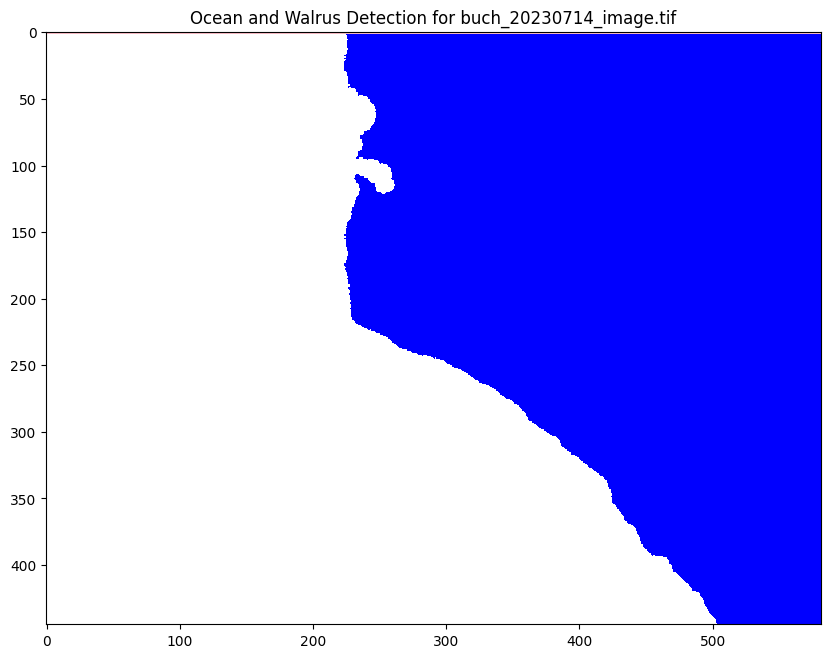

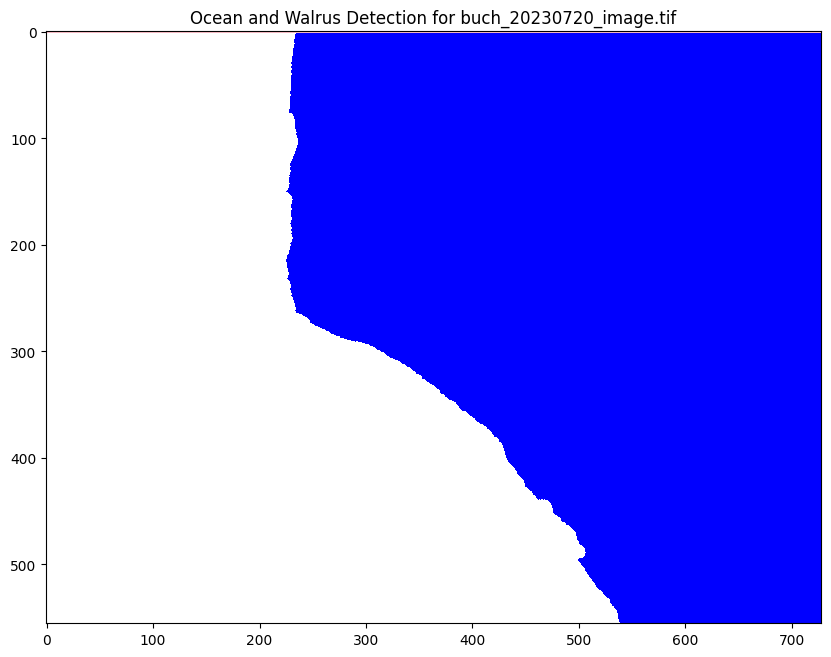

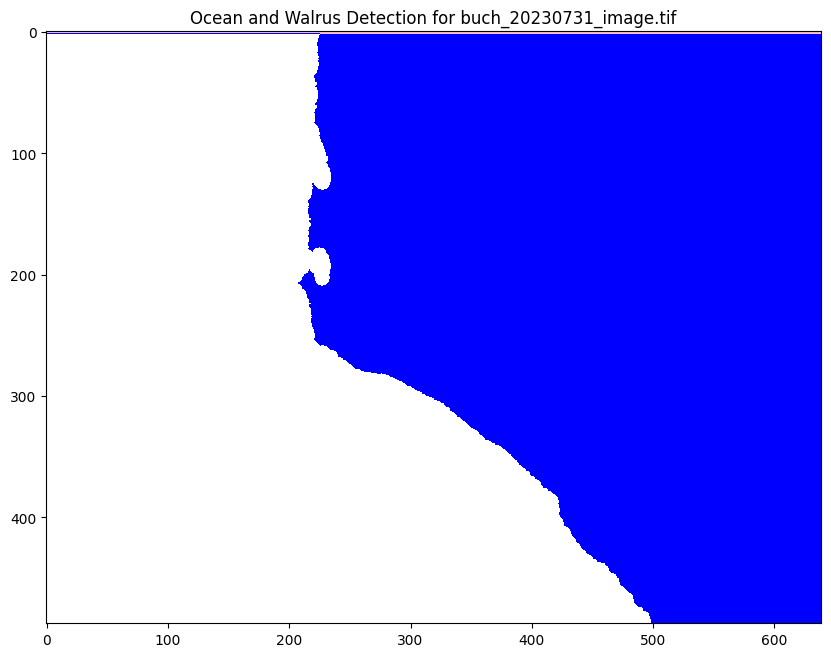

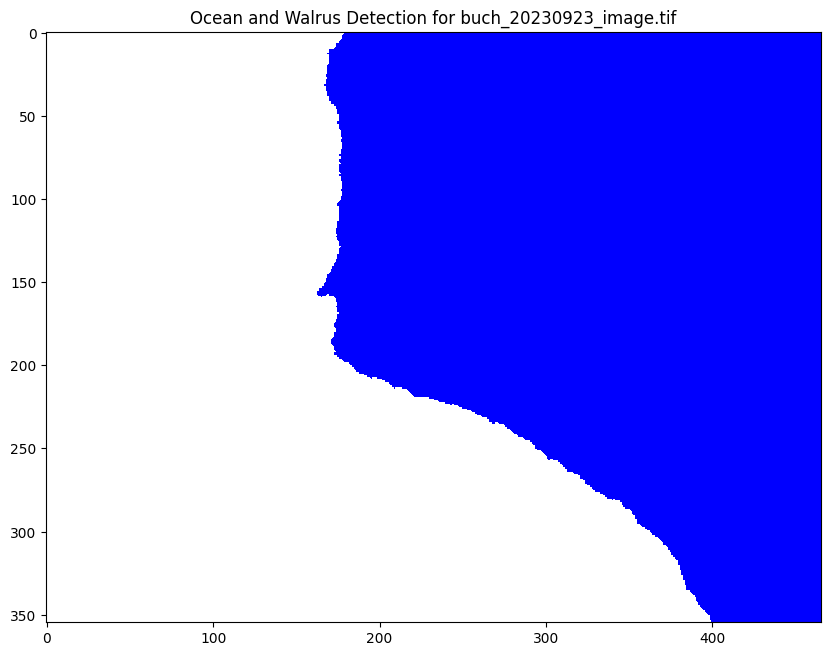

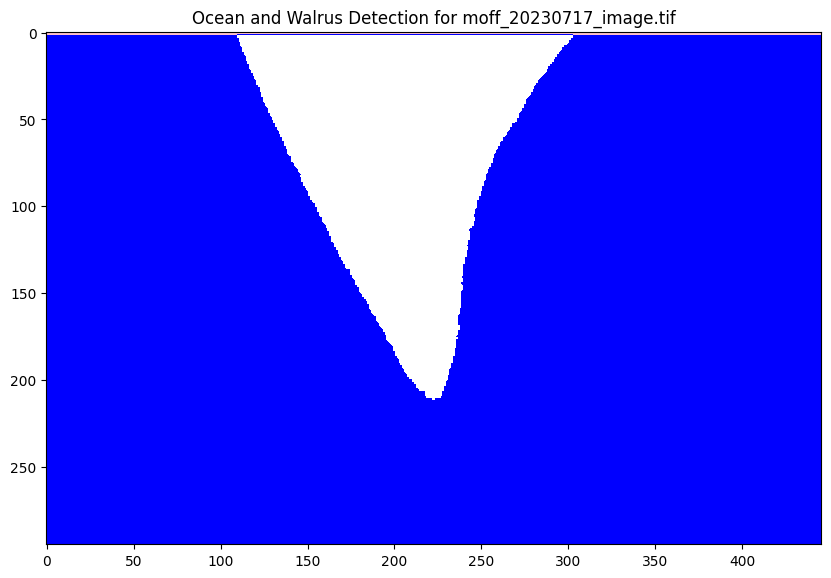

...

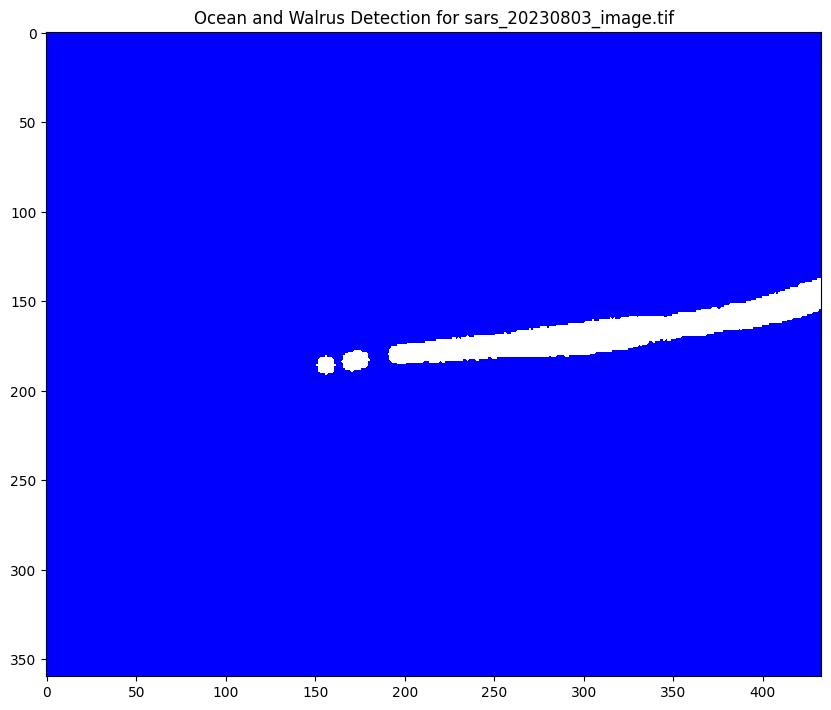

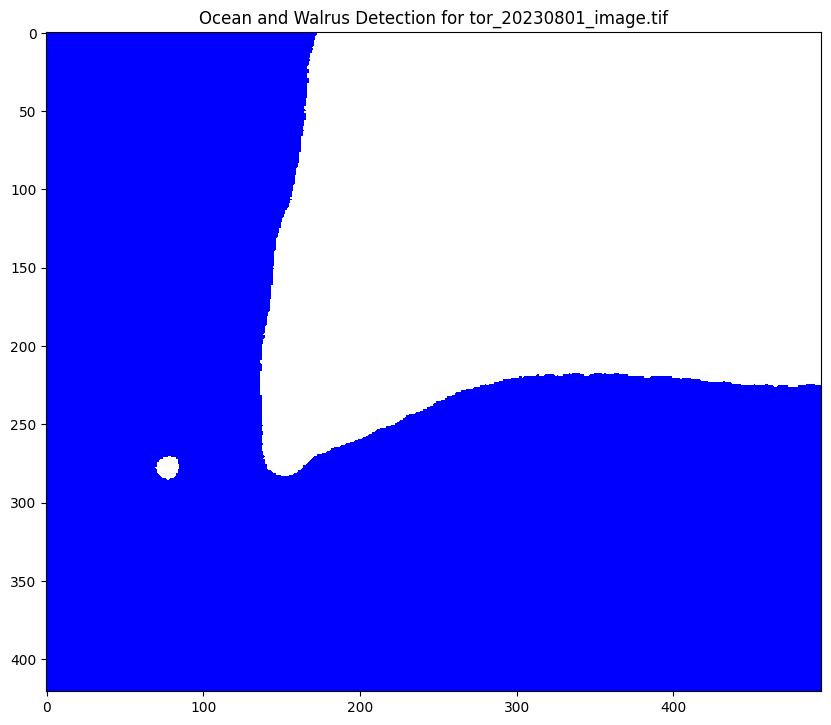

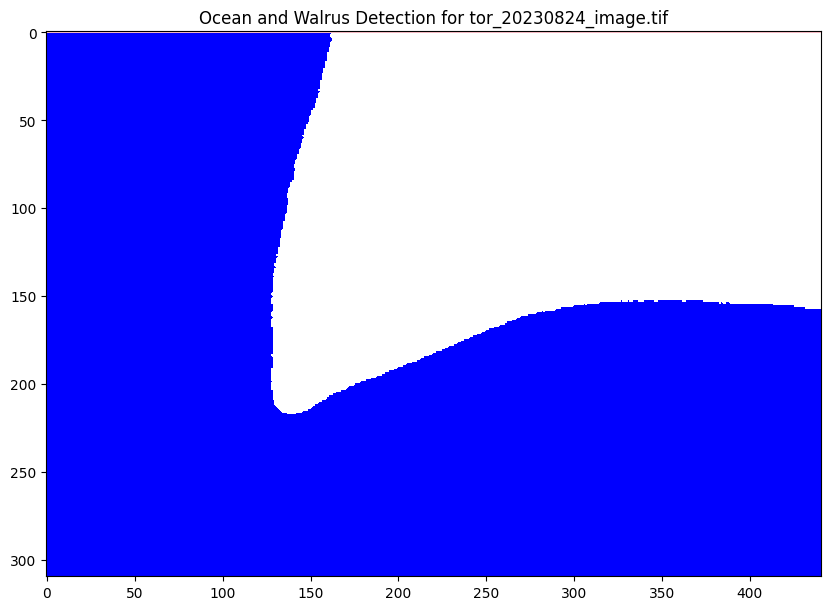

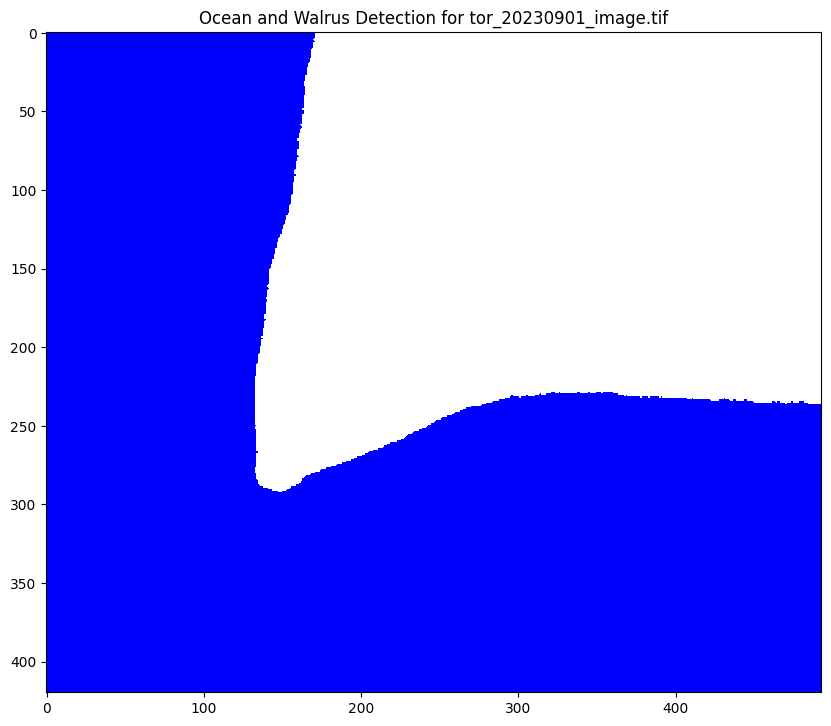

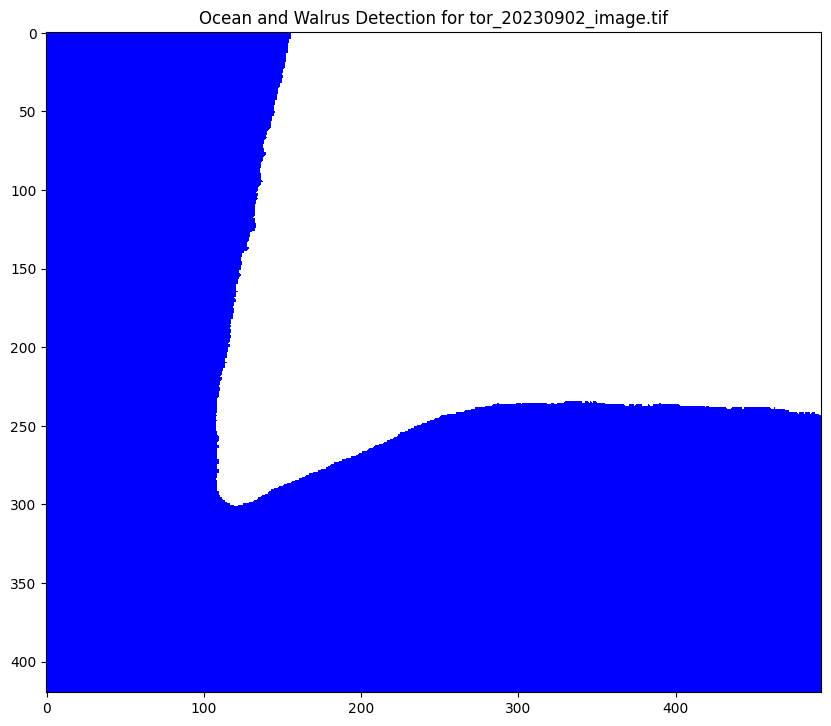

In [27]:
# Function to predict and plot walrus masks
def plot_walrus_mask(image_path, ocean_model, walrus_model):
    with rasterio.open(image_path) as src:
        image = src.read()
        image_reshaped = image.reshape((image.shape[0], -1)).T
        ocean_predictions = ocean_model.predict(image_reshaped).reshape(image.shape[1], image.shape[2])
        cleaned_ocean_predictions = post_process_ocean_mask(ocean_predictions)
        ocean_buffer = binary_dilation(cleaned_ocean_predictions, disk(50))
        walrus_predictions = walrus_model.predict(image_reshaped).reshape(image.shape[1], image.shape[2]) & ocean_buffer

        # Create a combined mask with ocean and walrus predictions
        combined_mask = np.zeros_like(ocean_predictions, dtype=int)
        combined_mask[cleaned_ocean_predictions] = 1  # Ocean in blue
        combined_mask[walrus_predictions] = 2  # Walrus in pink

        # Plot the combined mask
        plt.figure(figsize=(10, 10))
        plt.title(f"Ocean and Walrus Detection for {os.path.basename(image_path)}")
        plt.imshow(combined_mask, cmap=mcolors.ListedColormap(['white', 'blue', 'pink']))
        plt.show()

# Plot predictions for training images
for image_path in image_paths:
    plot_walrus_mask(image_path, ocean_model, walrus_model)

In [ ]:
# Plot predictions for unseen images
for image_path in unlabeled_image_paths:
    plot_walrus_mask(image_path, ocean_model, walrus_model)


In [12]:
import os
import re
import glob
import numpy as np
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from rasterio.mask import geometry_mask
from skimage.morphology import remove_small_objects, binary_closing, binary_dilation, disk

In [13]:
# Define the directories containing images and shapefiles
image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_images"
shapefile_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_train"
unlabeled_image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_unlabeled"

# Use glob to list all .tif and .shp files in the specified directories
image_paths = glob.glob(f"{image_dir}/*.tif")
shapefile_paths = glob.glob(f"{shapefile_dir}/*.shp")
unlabeled_image_paths = glob.glob(f"{unlabeled_image_dir}/*.tif")

# Function to extract island name and date from file names
def extract_island_and_date(filename):
    pattern = r'([a-zA-Z]+)_(\d{8})'
    match = re.search(pattern, filename)
    if match:
        return match.group(1), match.group(2)
    return None, None

# Pair image and shapefile paths based on filenames
def pair_files(image_paths, shapefile_paths):
    file_pairs = {}
    for image_path in image_paths:
        island, date = extract_island_and_date(os.path.basename(image_path))
        if island is None or date is None:
            print(f"Failed to extract island and date from {image_path}")
            continue

        matching_shapefiles = [shapefile for shapefile in shapefile_paths if island in shapefile and date in shapefile]
        if not matching_shapefiles:
            print(f"No matching shapefile found for {image_path}")
            continue

        shapefile_path = matching_shapefiles[0]
        file_pairs[image_path] = shapefile_path
    return file_pairs

file_pairs = pair_files(image_paths, shapefile_paths)

# Function to extract features and labels for the ocean model
def extract_features_labels(image_path, shapefile_path):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    for _, row in gdf.iterrows():
        mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
        feature_pixels = image[:, mask]
        label = row['label']

        if label == 'ocean':
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Ocean label
        else:
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Non-ocean label

    return np.array(features), np.array(labels)

# Extract features and labels for all image-shapefile pairs
def get_dataset(file_pairs):
    features = []
    labels = []

    for image_path, shapefile_path in file_pairs.items():
        img_features, img_labels = extract_features_labels(image_path, shapefile_path)
        features.append(img_features)
        labels.append(img_labels)

    features = np.vstack(features)
    labels = np.hstack(labels)
    return features, labels

features, labels = get_dataset(file_pairs)

No matching shapefile found for C:\Users\Student\Documents\101_walrus_data\train\clipped_images\pool_20230803_image.tif


In [14]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train a Random Forest model
ocean_model = RandomForestClassifier(n_estimators=100, random_state=42)
ocean_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# Evaluate the model
y_pred = ocean_model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

In [15]:
# Post-processing function to remove small isolated regions
def post_process_ocean_mask(mask, min_size=500):
    # Remove small objects (less than min_size pixels)
    cleaned_mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    # Apply morphological closing to smooth boundaries
    cleaned_mask = binary_closing(cleaned_mask, disk(5))
    return cleaned_mask

# Function to create ROI around the Ocean Masks
def create_ocean_roi(model, image_paths, buffer_size=50):
    for image_path in image_paths:
        with rasterio.open(image_path) as src:
            image = src.read()
            image_reshaped = image.reshape((image.shape[0], -1)).T
            predictions = model.predict(image_reshaped).reshape(image.shape[1], image.shape[2])
            cleaned_predictions = remove_small_objects(predictions.astype(bool), min_size=500)
            cleaned_predictions = binary_closing(cleaned_predictions, disk(5))
            ocean_buffer = binary_dilation(cleaned_predictions, disk(buffer_size))
            yield ocean_buffer, image_path

# Extract walrus features within the ROI for each image
def extract_walrus_features(image_path, shapefile_path, roi_mask):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    for _, row in gdf.iterrows():
        if row['label'] in ['walrus_pure', 'walrus_mixed']:
            mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
            feature_pixels = image[:, mask & roi_mask]
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Walrus label
        else:
            mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
            feature_pixels = image[:, mask & roi_mask]
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Non-walrus label

    return np.array(features), np.array(labels)

# Process walrus dataset in batches to avoid memory issues
def get_walrus_dataset(file_pairs, roi_masks):
    for (roi_mask, image_path) in roi_masks:
        shapefile_path = file_pairs[image_path]
        img_features, img_labels = extract_walrus_features(image_path, shapefile_path, roi_mask)
        yield img_features, img_labels

# Training walrus model in batches
walrus_features, walrus_labels = [], []
for img_features, img_labels in get_walrus_dataset(file_pairs, create_ocean_roi(ocean_model, image_paths)):
    walrus_features.append(img_features)
    walrus_labels.append(img_labels)

walrus_features = np.vstack(walrus_features)
walrus_labels = np.hstack(walrus_labels)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(walrus_features, walrus_labels, test_size=0.2, random_state=42)

KeyError: 'C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_images\\pool_20230803_image.tif'

In [16]:
# Train a Random Forest model for walrus detection
walrus_model = RandomForestClassifier(n_estimators=100, random_state=42)
walrus_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# Evaluate the walrus detection model
y_pred = walrus_model.predict(X_test)
print(f"Walrus Detection Accuracy: {accuracy_score(y_test, y_pred)}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


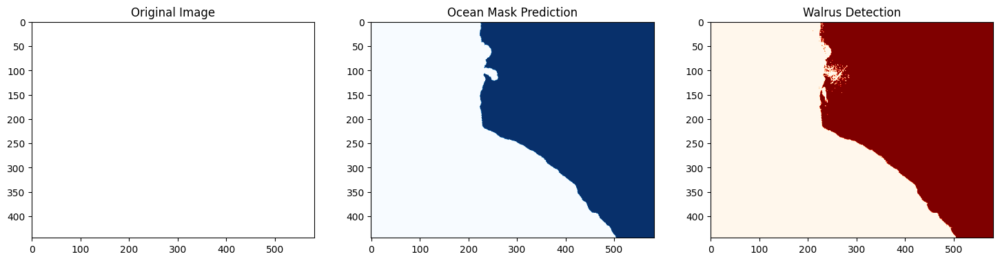

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


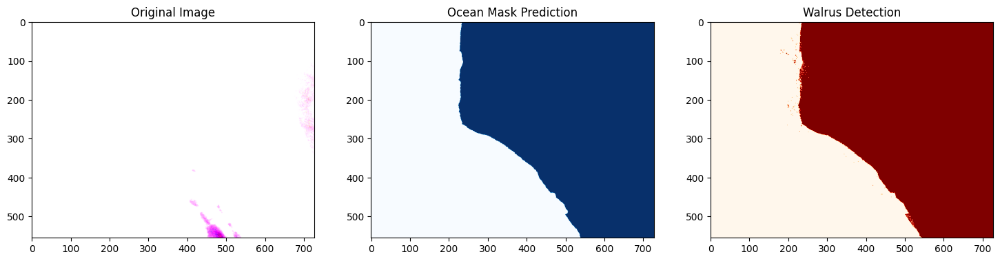

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


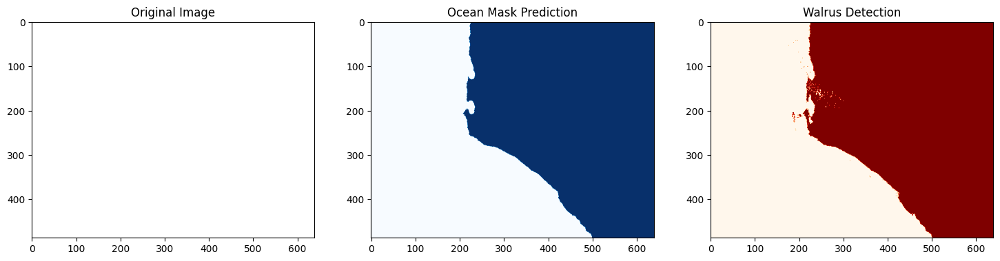

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


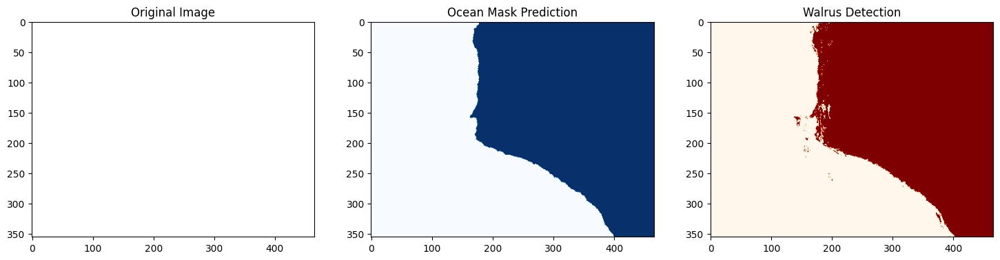

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


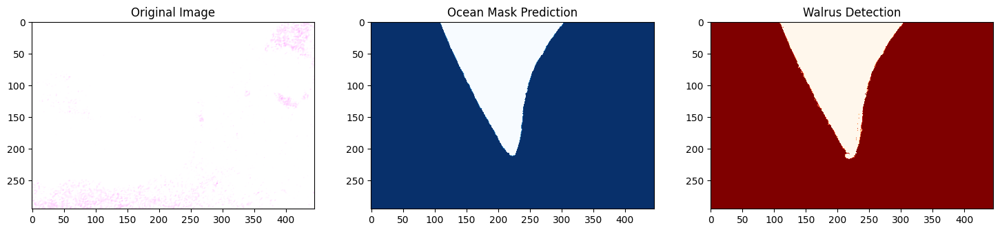

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


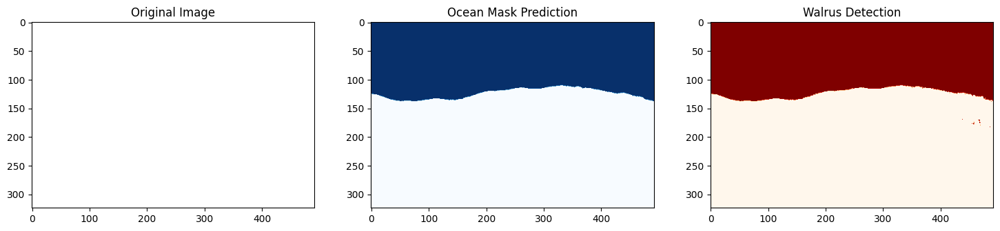

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


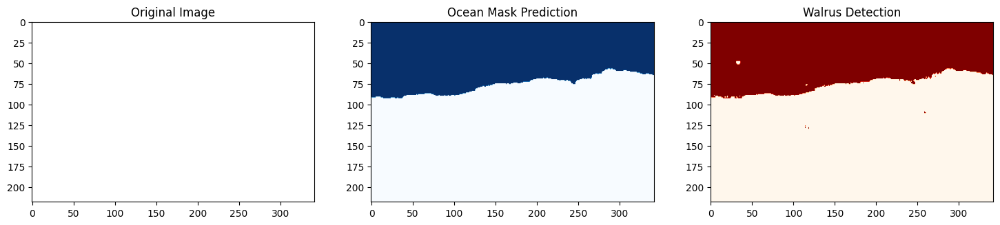

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


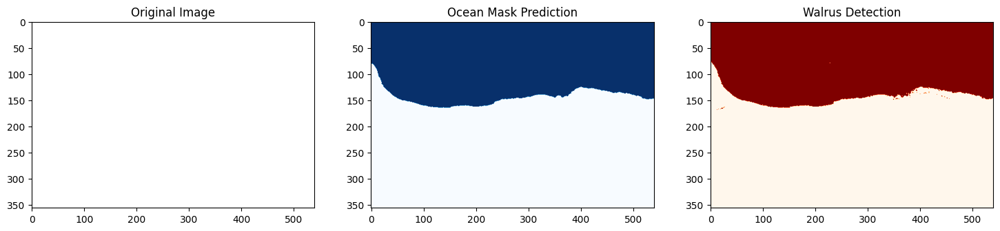

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


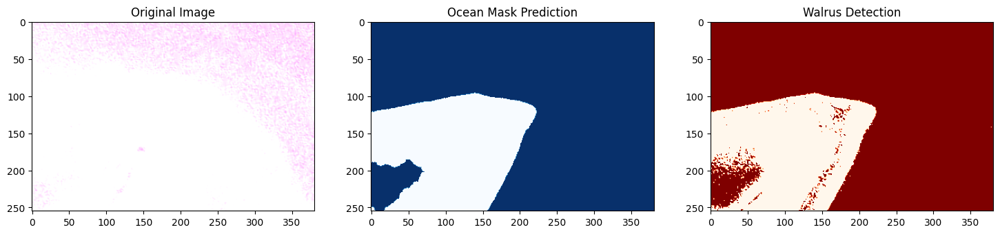

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


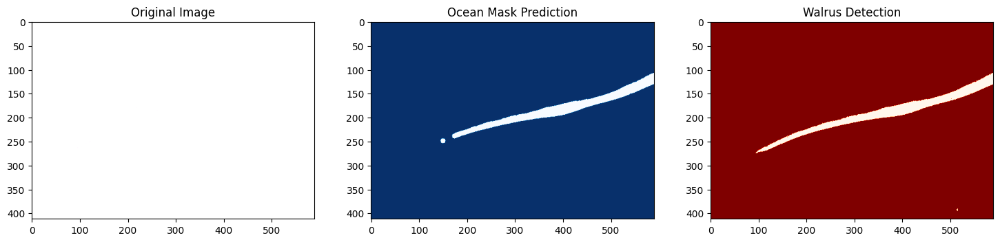

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


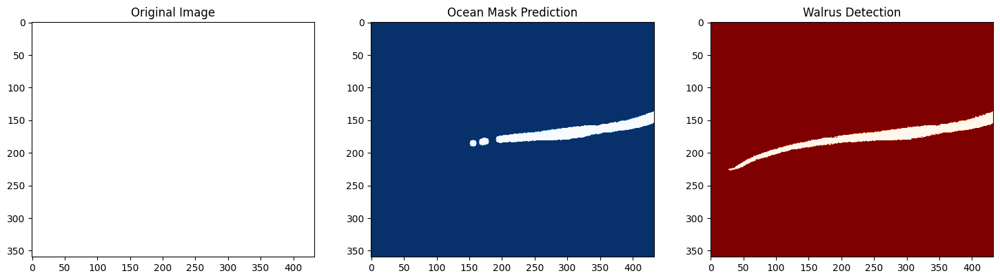

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


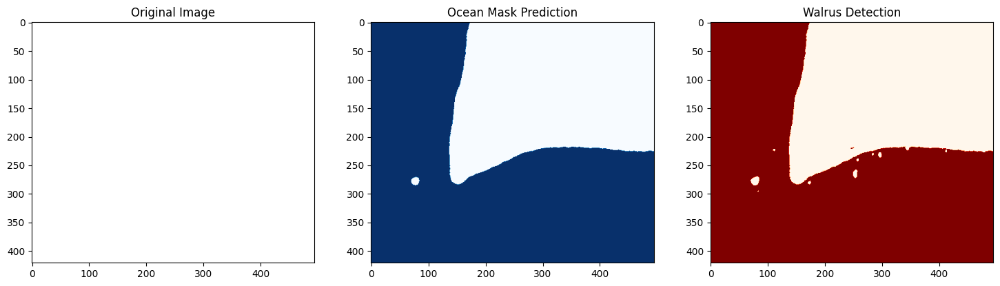

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


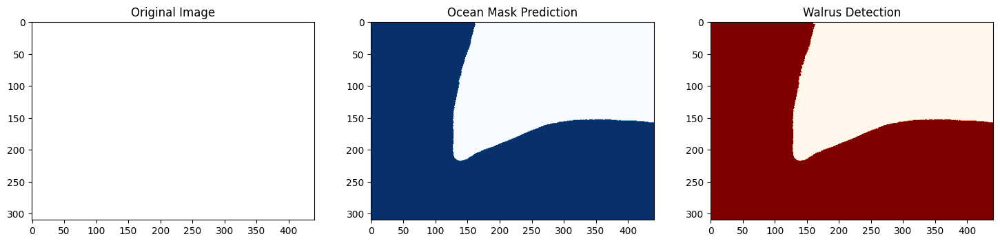

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


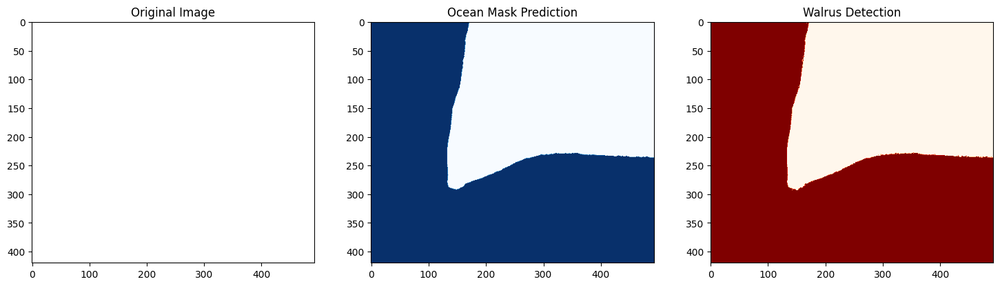

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


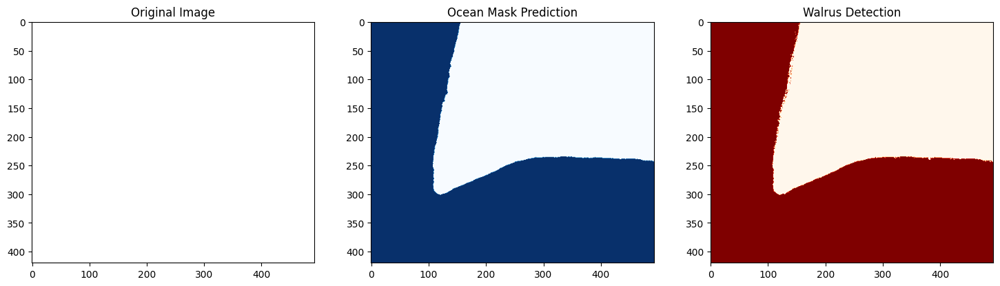

In [17]:
# Function to predict and plot walrus masks
def plot_walrus_mask(image_path, ocean_model, walrus_model):
    with rasterio.open(image_path) as src:
        image = src.read()
        image_reshaped = image.reshape((image.shape[0], -1)).T
        ocean_predictions = ocean_model.predict(image_reshaped).reshape(image.shape[1], image.shape[2])
        cleaned_ocean_predictions = remove_small_objects(ocean_predictions.astype(bool), min_size=500)
        cleaned_ocean_predictions = binary_closing(cleaned_ocean_predictions, disk(5))
        ocean_buffer = binary_dilation(cleaned_ocean_predictions, disk(50))
        walrus_predictions = walrus_model.predict(image_reshaped).reshape(image.shape[1], image.shape[2]) & ocean_buffer

        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        plt.imshow(image.transpose(1, 2, 0)[:,:,:3])  # Display RGB composite
        
        plt.subplot(1, 3, 2)
        plt.title("Ocean Mask Prediction")
        plt.imshow(cleaned_ocean_predictions, cmap='Blues')
        
        plt.subplot(1, 3, 3)
        plt.title("Walrus Detection")
        plt.imshow(walrus_predictions, cmap='OrRd')
        
        plt.show()

# Plot predictions for training images
for image_path in image_paths:
    plot_walrus_mask(image_path, ocean_model, walrus_model)

In [ ]:
# Plot predictions for unseen images
for image_path in unlabeled_image_paths:
    plot_walrus_mask(image_path, ocean_model, walrus_model)


TEST 1 

In [1]:
import os
import re
import glob
import numpy as np
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from rasterio.mask import geometry_mask

In [2]:
# Define the directories containing images and shapefiles
image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_images"
shapefile_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_train"
unlabeled_image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_unlabeled"

# Use glob to list all .tif and .shp files in the specified directories
image_paths = glob.glob(f"{image_dir}/*.tif")
shapefile_paths = glob.glob(f"{shapefile_dir}/*.shp")
unlabeled_image_paths = glob.glob(f"{unlabeled_image_dir}/*.tif")

# Function to extract island name and date from file names
def extract_island_and_date(filename):
    pattern = r'([a-zA-Z]+)_(\d{8})'
    match = re.search(pattern, filename)
    if match:
        return match.group(1), match.group(2)
    return None, None

# Pair image and shapefile paths based on filenames
def pair_files(image_paths, shapefile_paths):
    file_pairs = {}
    for image_path in image_paths:
        island, date = extract_island_and_date(os.path.basename(image_path))
        if island is None or date is None:
            print(f"Failed to extract island and date from {image_path}")
            continue

        matching_shapefiles = [shapefile for shapefile in shapefile_paths if island in shapefile and date in shapefile]
        if not matching_shapefiles:
            print(f"No matching shapefile found for {image_path}")
            continue

        shapefile_path = matching_shapefiles[0]
        file_pairs[image_path] = shapefile_path
    return file_pairs

file_pairs = pair_files(image_paths, shapefile_paths)

# Function to extract features and labels
def extract_features_labels(image_path, shapefile_path):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    for _, row in gdf.iterrows():
        mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
        feature_pixels = image[:, mask]
        label = row['label']

        # Only keep 'ocean' labels
        if label == 'ocean':
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Ocean label

        # Non-ocean pixels are labeled as 0
        elif label != 'ocean':
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Non-ocean label

    return np.array(features), np.array(labels)

# Extract features and labels for all image-shapefile pairs
def get_dataset(file_pairs):
    features = []
    labels = []

    for image_path, shapefile_path in file_pairs.items():
        img_features, img_labels = extract_features_labels(image_path, shapefile_path)
        features.append(img_features)
        labels.append(img_labels)

    features = np.vstack(features)
    labels = np.hstack(labels)
    return features, labels

features, labels = get_dataset(file_pairs)

No matching shapefile found for C:\Users\Student\Documents\101_walrus_data\train\clipped_images\pool_20230803_image.tif


In [3]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train a Random Forest model
model = RandomForestClassifier(n_estimators=300, random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(n_estimators=300, random_state=42)

In [4]:
# Evaluate the model
y_pred = model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.9975278834149819

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     86661
           1       1.00      1.00      1.00    156046

    accuracy                           1.00    242707
   macro avg       1.00      1.00      1.00    242707
weighted avg       1.00      1.00      1.00    242707


Confusion Matrix:
[[ 86469    192]
 [   408 155638]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


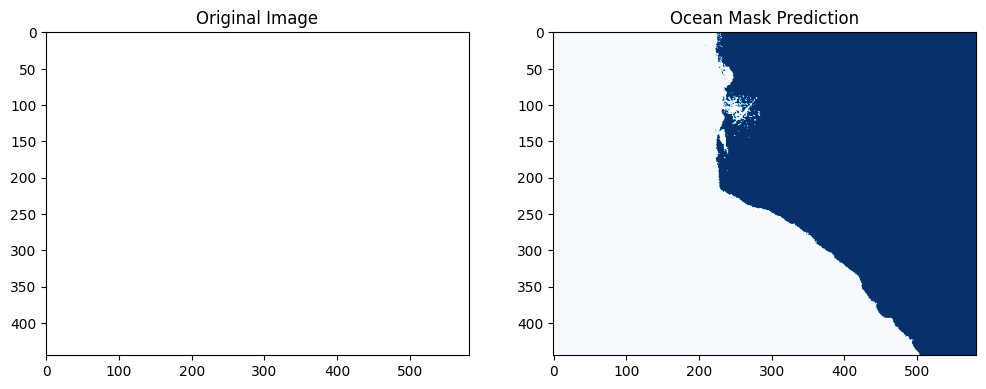

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


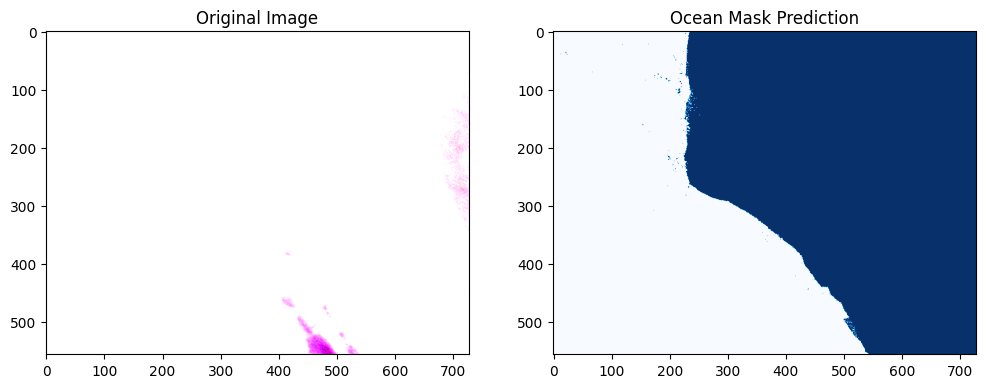

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


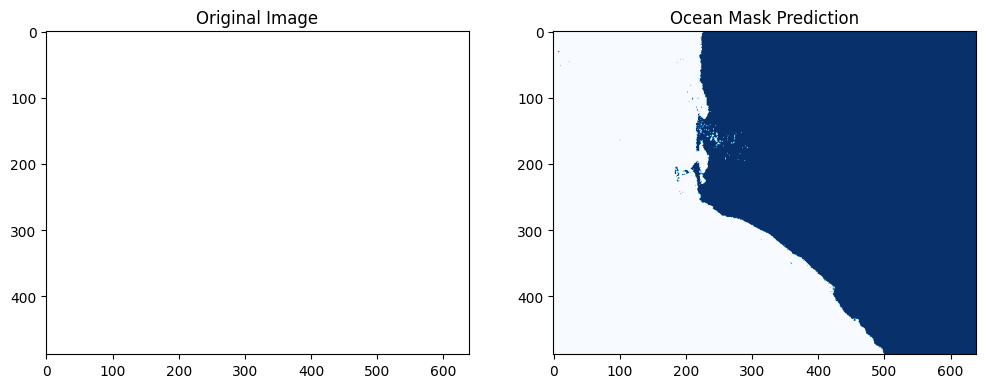

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


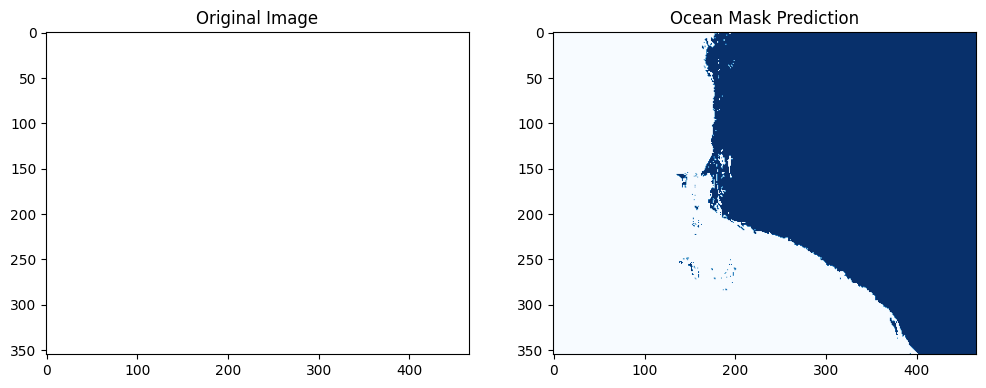

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


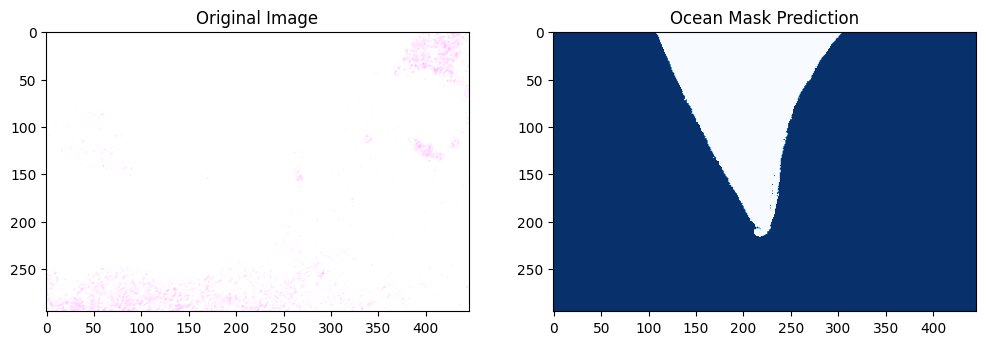

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


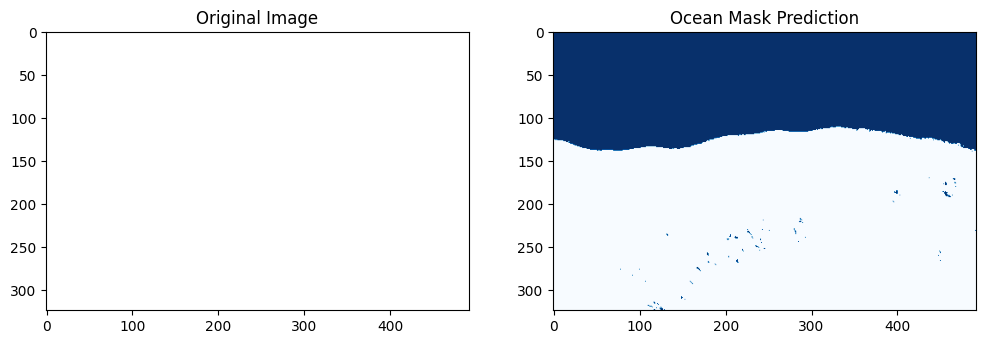

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


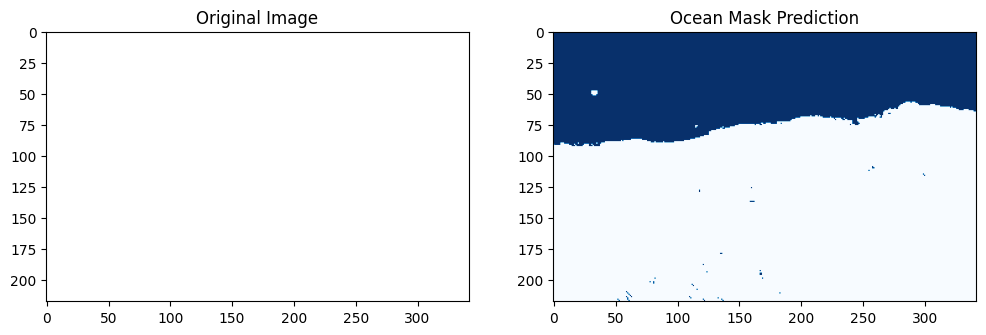

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


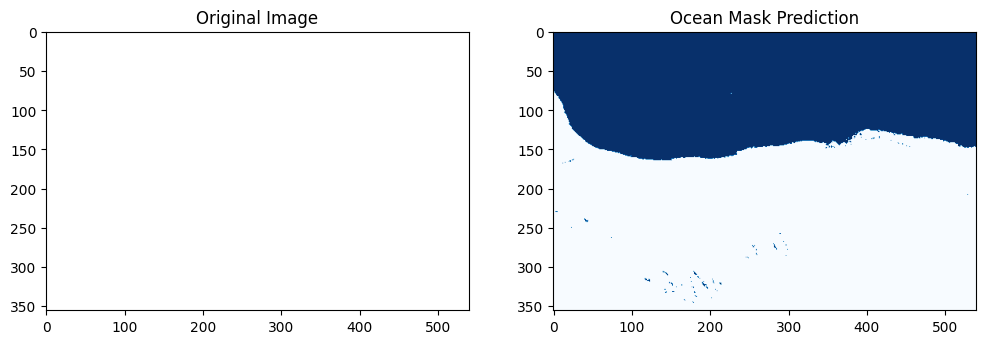

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


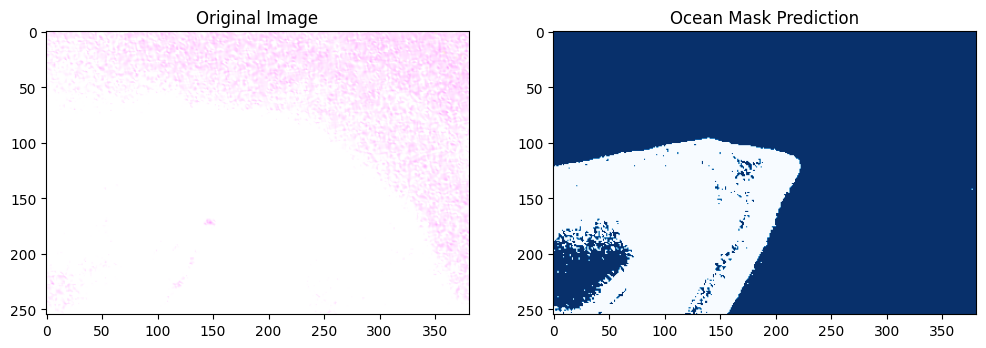

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


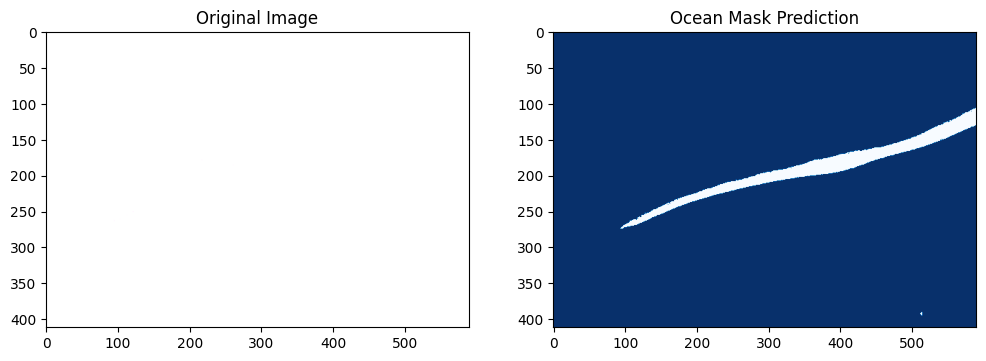

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


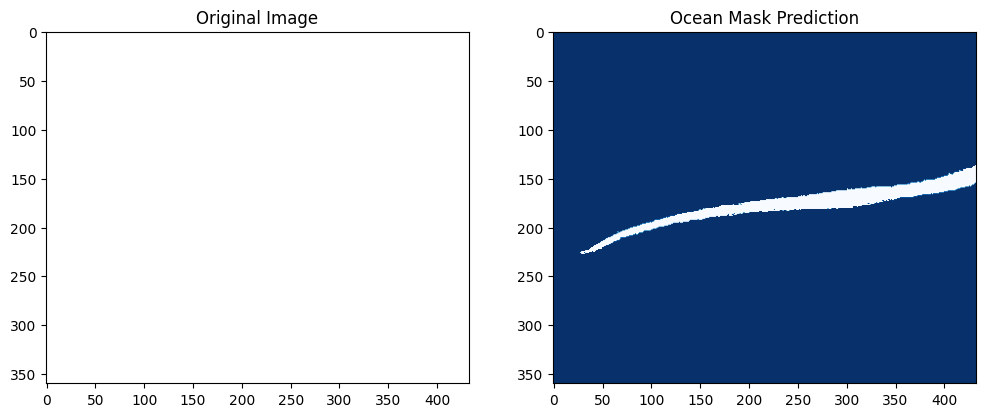

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


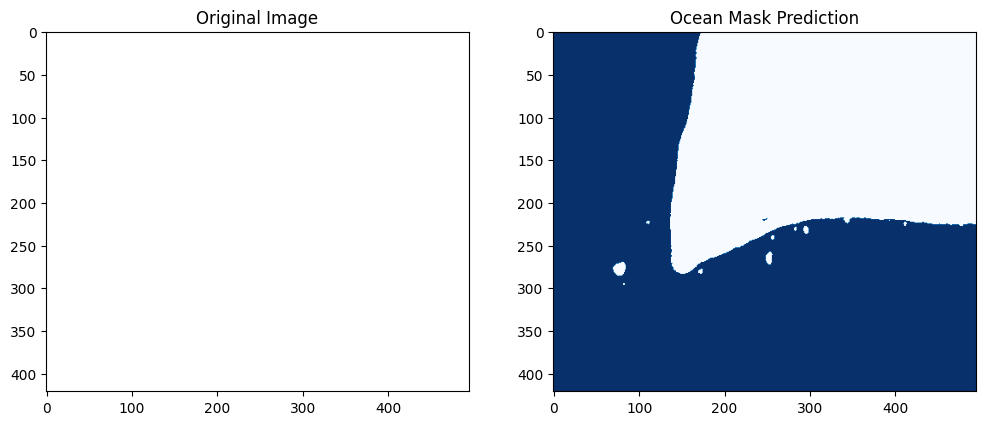

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


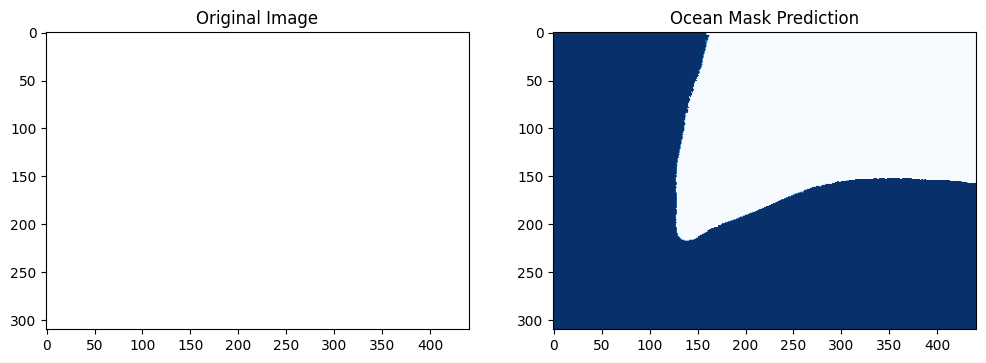

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


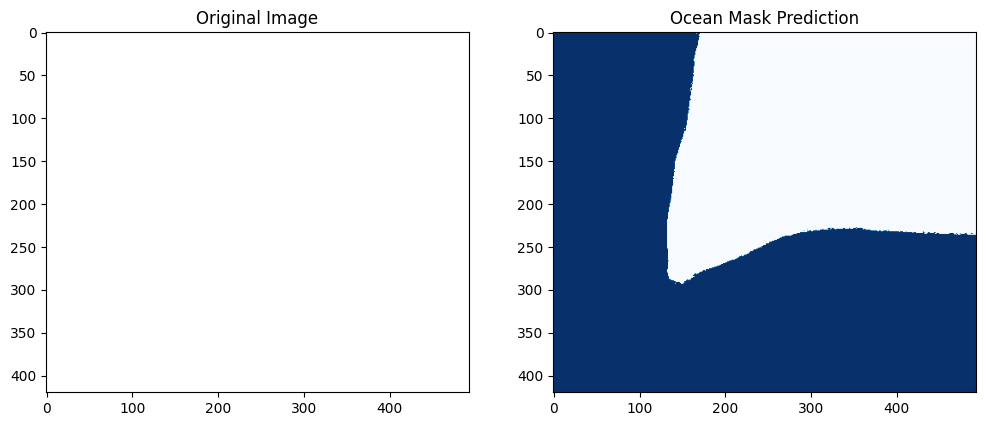

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


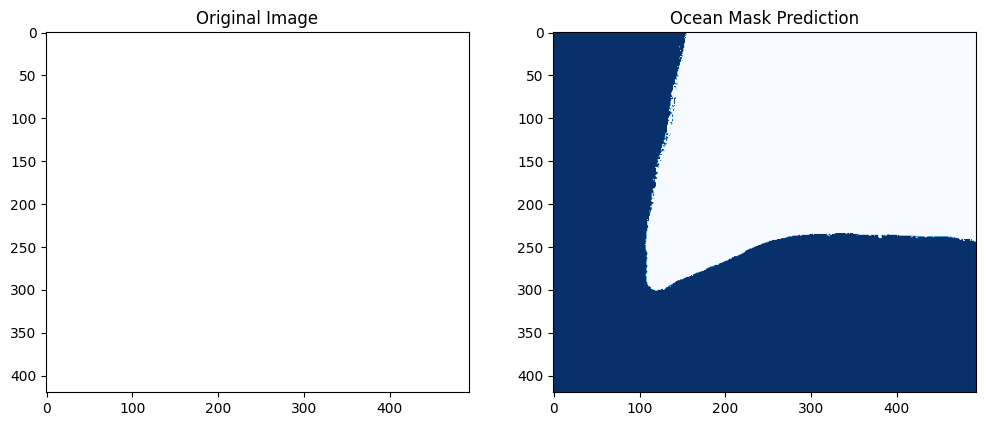

In [5]:
# Function to predict and plot ocean masks
def plot_ocean_mask(image_path, model):
    with rasterio.open(image_path) as src:
        image = src.read()
        image_reshaped = image.reshape((image.shape[0], -1)).T
        predictions = model.predict(image_reshaped).reshape(image.shape[1], image.shape[2])
        
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(image.transpose(1, 2, 0)[:,:,:3])  # Display RGB composite
        
        plt.subplot(1, 2, 2)
        plt.title("Ocean Mask Prediction")
        plt.imshow(predictions, cmap='Blues')
        
        plt.show()

# Plot predictions for training images
for image_path in image_paths:
    plot_ocean_mask(image_path, model)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


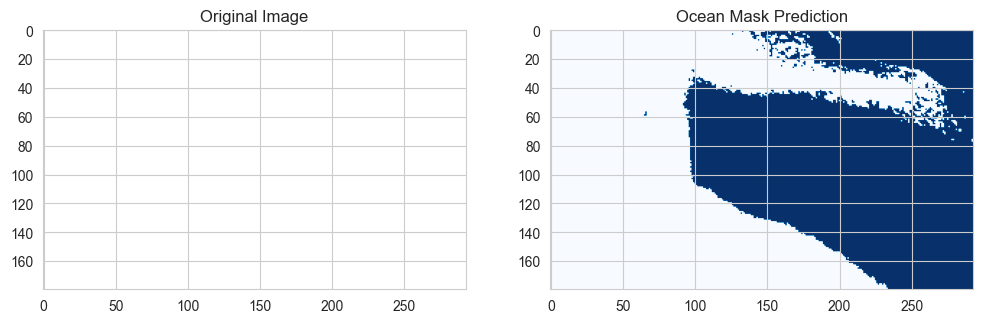

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


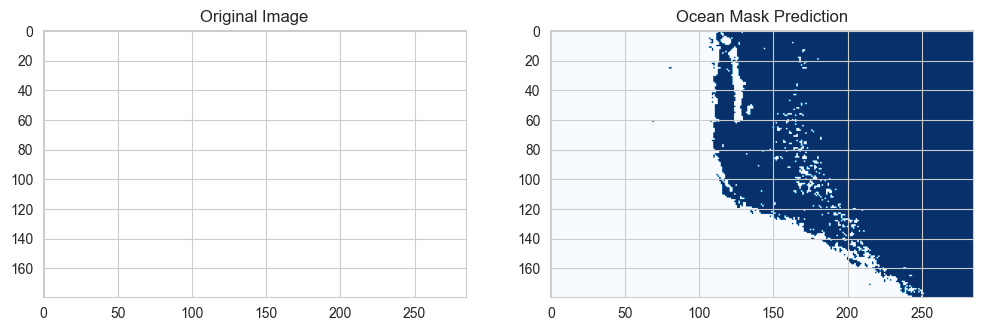

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


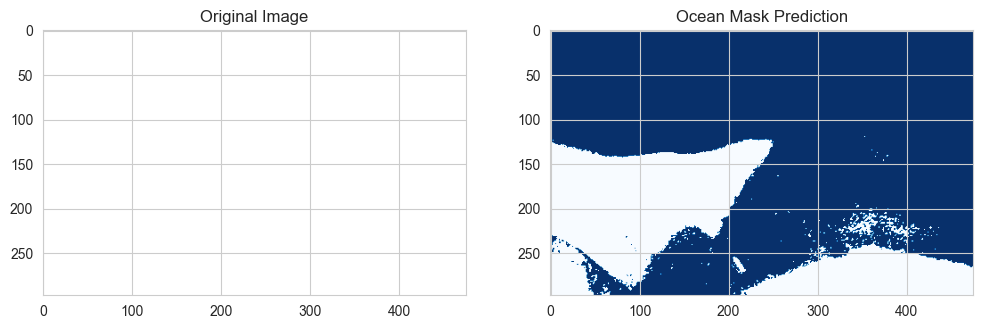

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


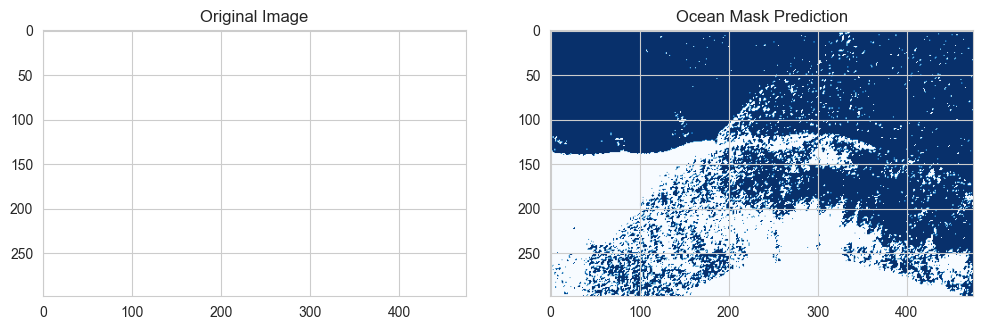

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


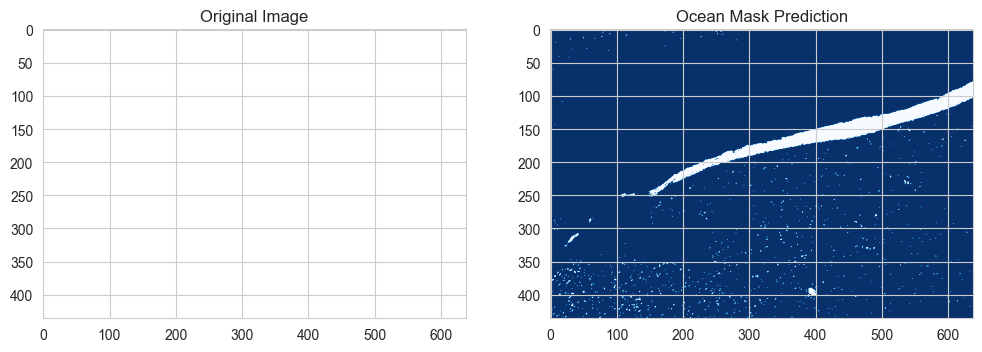

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


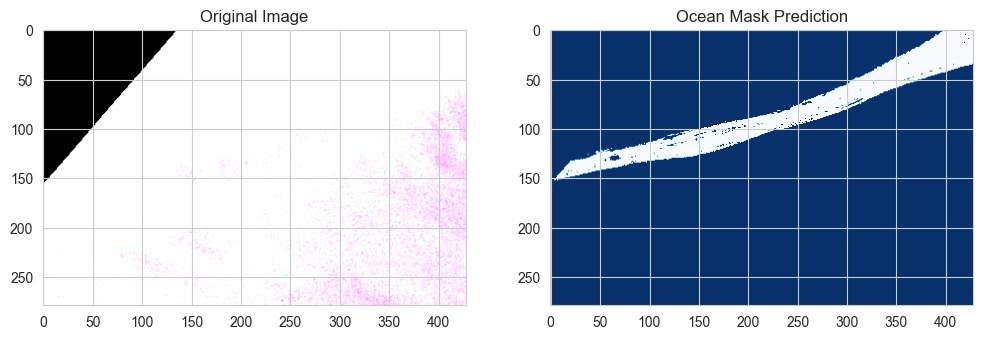

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


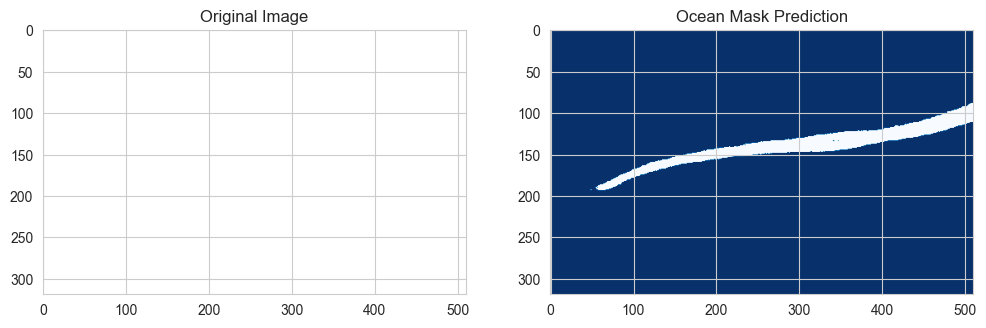

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


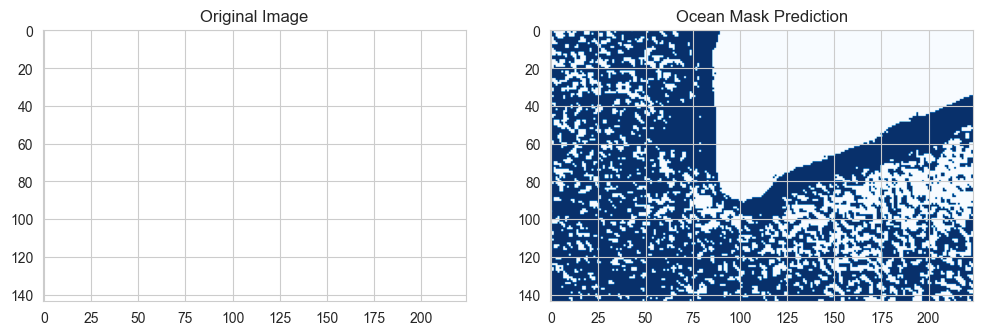

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


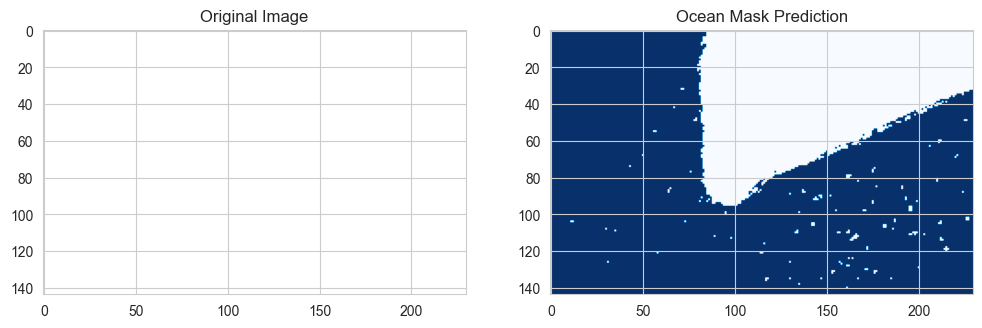

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


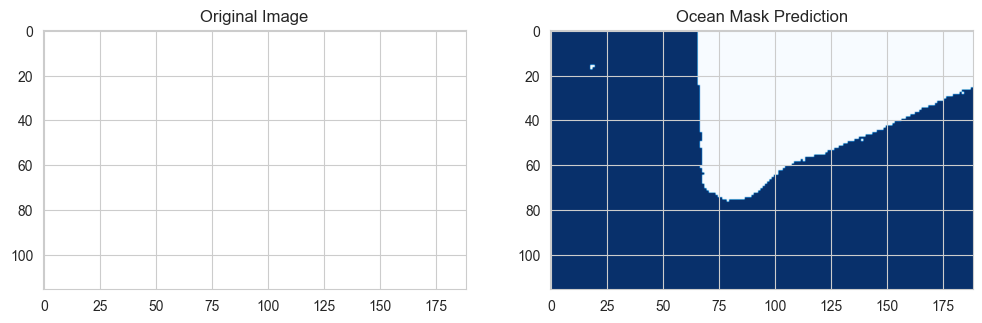

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


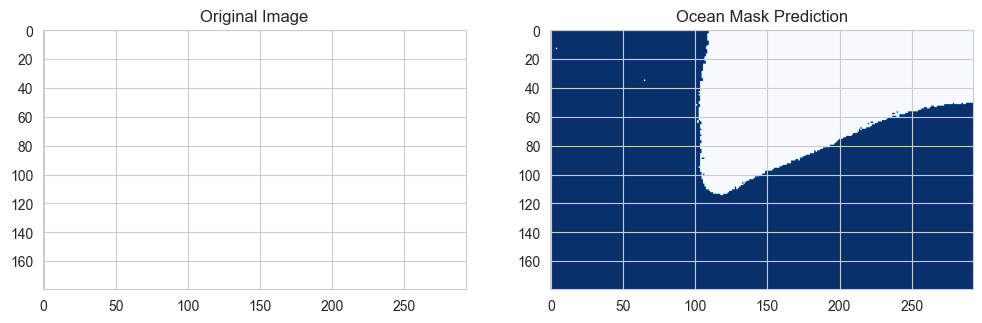

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


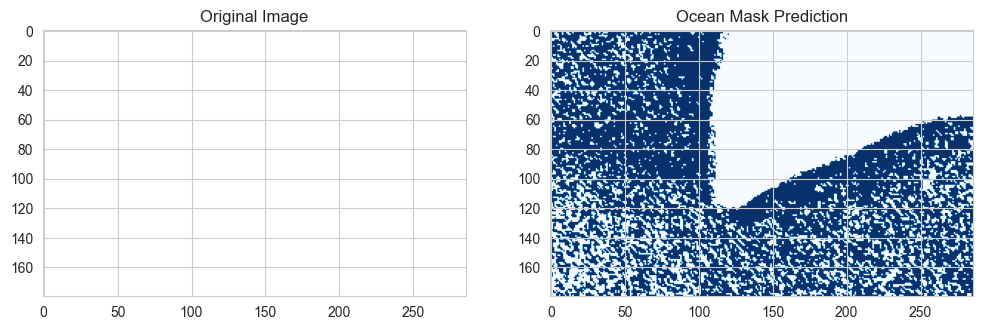

In [16]:
# Plot predictions for unseen images
for image_path in unlabeled_image_paths:
    plot_ocean_mask(image_path, model)


WITH IMAGE CLEAN UP 

In [17]:
import os
import re
import glob
import numpy as np
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from rasterio.mask import geometry_mask
from skimage.morphology import remove_small_objects, binary_closing, binary_opening, disk

# Define the directories containing images and shapefiles
image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_images"
shapefile_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_train"
unlabeled_image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_unlabeled"

# Use glob to list all .tif and .shp files in the specified directories
image_paths = glob.glob(f"{image_dir}/*.tif")
shapefile_paths = glob.glob(f"{shapefile_dir}/*.shp")
unlabeled_image_paths = glob.glob(f"{unlabeled_image_dir}/*.tif")

# Function to extract island name and date from file names
def extract_island_and_date(filename):
    pattern = r'([a-zA-Z]+)_(\d{8})'
    match = re.search(pattern, filename)
    if match:
        return match.group(1), match.group(2)
    return None, None

# Pair image and shapefile paths based on filenames
def pair_files(image_paths, shapefile_paths):
    file_pairs = {}
    for image_path in image_paths:
        island, date = extract_island_and_date(os.path.basename(image_path))
        if island is None or date is None:
            print(f"Failed to extract island and date from {image_path}")
            continue

        matching_shapefiles = [shapefile for shapefile in shapefile_paths if island in shapefile and date in shapefile]
        if not matching_shapefiles:
            print(f"No matching shapefile found for {image_path}")
            continue

        shapefile_path = matching_shapefiles[0]
        file_pairs[image_path] = shapefile_path
    return file_pairs

file_pairs = pair_files(image_paths, shapefile_paths)

# Function to extract features and labels
def extract_features_labels(image_path, shapefile_path):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    for _, row in gdf.iterrows():
        mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
        feature_pixels = image[:, mask]
        label = row['label']

        # Only keep 'ocean' labels
        if label == 'ocean':
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Ocean label

        # Non-ocean pixels are labeled as 0
        elif label != 'ocean':
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Non-ocean label

    return np.array(features), np.array(labels)

# Extract features and labels for all image-shapefile pairs
def get_dataset(file_pairs):
    features = []
    labels = []

    for image_path, shapefile_path in file_pairs.items():
        img_features, img_labels = extract_features_labels(image_path, shapefile_path)
        features.append(img_features)
        labels.append(img_labels)

    features = np.vstack(features)
    labels = np.hstack(labels)
    return features, labels

features, labels = get_dataset(file_pairs)

No matching shapefile found for C:\Users\Student\Documents\101_walrus_data\train\clipped_images\pool_20230803_image.tif


In [18]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train a Random Forest model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [19]:
# Evaluate the model
y_pred = model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.99750728244344

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     86661
           1       1.00      1.00      1.00    156046

    accuracy                           1.00    242707
   macro avg       1.00      1.00      1.00    242707
weighted avg       1.00      1.00      1.00    242707


Confusion Matrix:
[[ 86471    190]
 [   415 155631]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


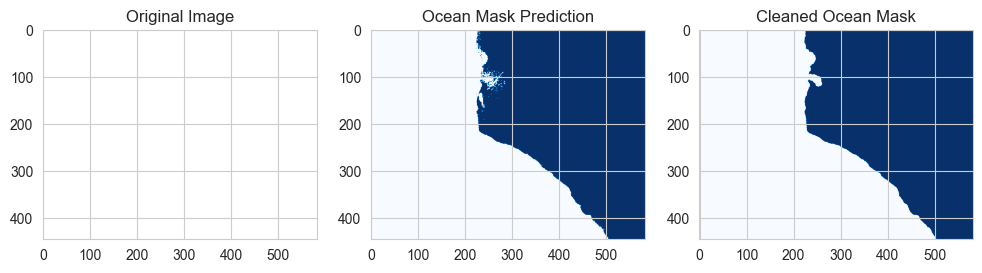

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


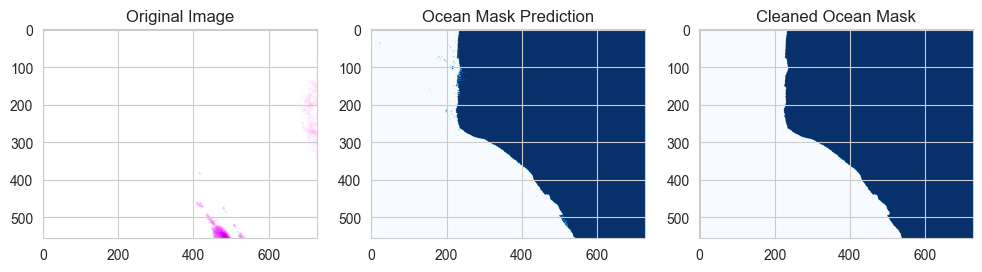

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


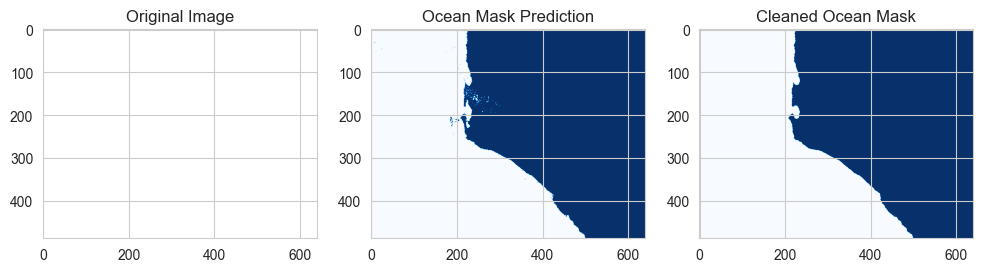

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


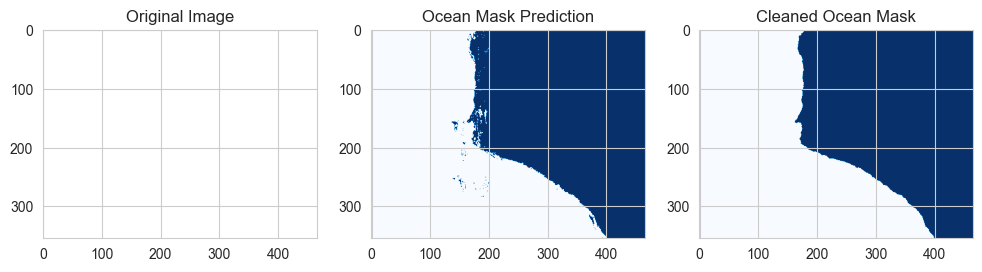

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


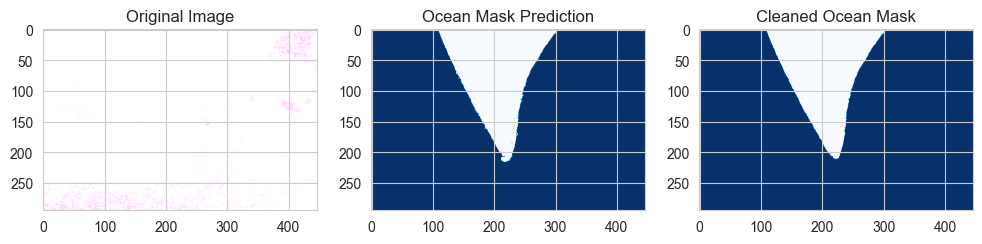

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


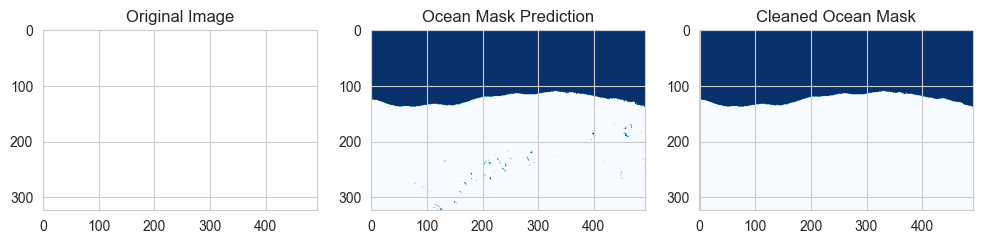

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


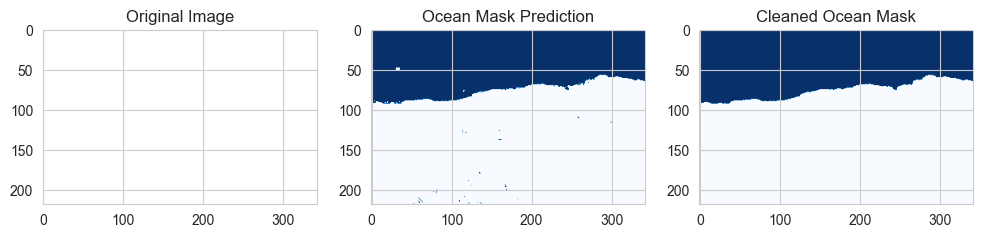

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


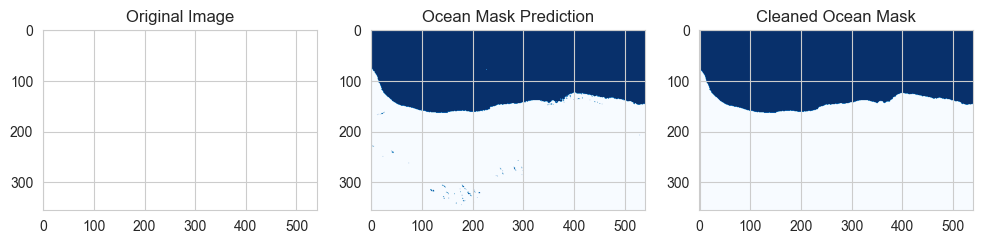

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


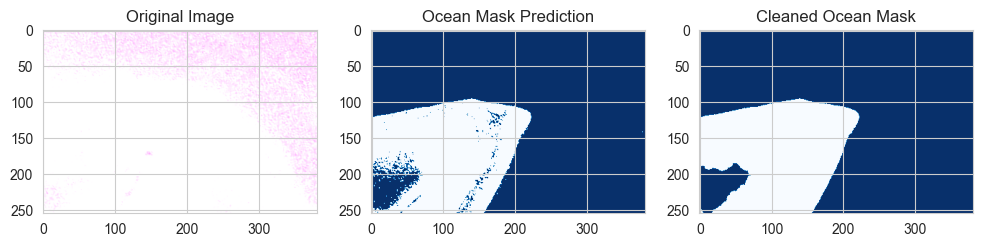

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


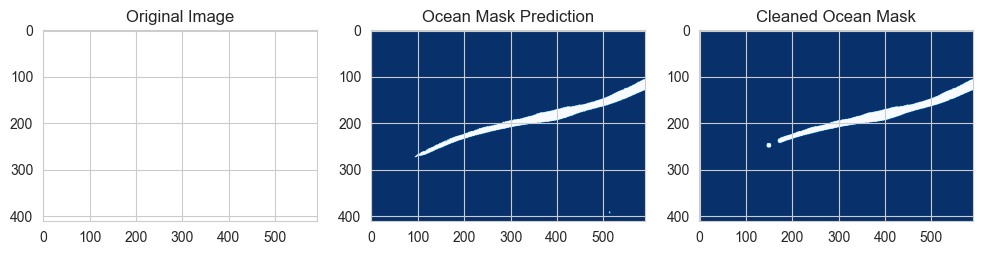

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


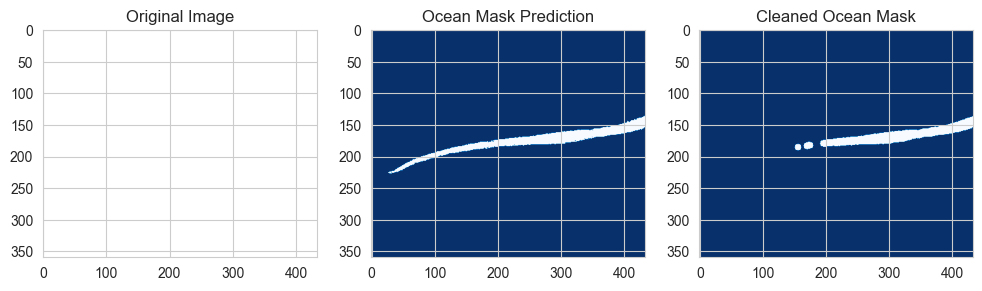

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


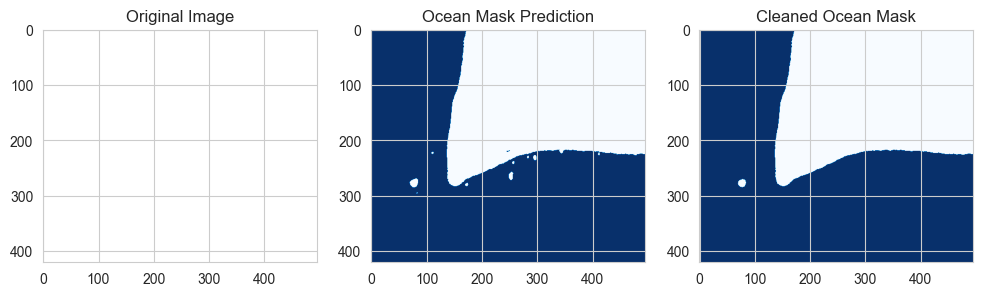

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


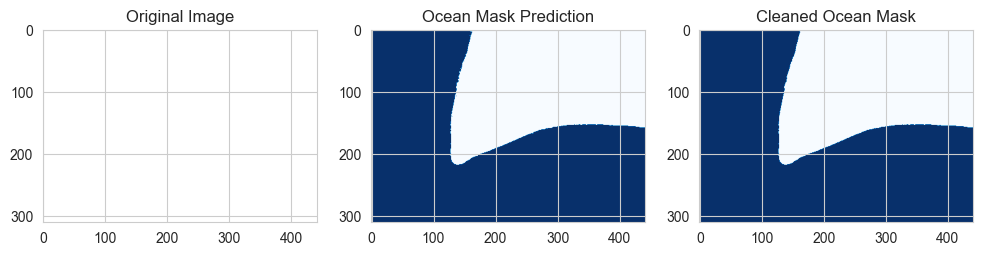

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


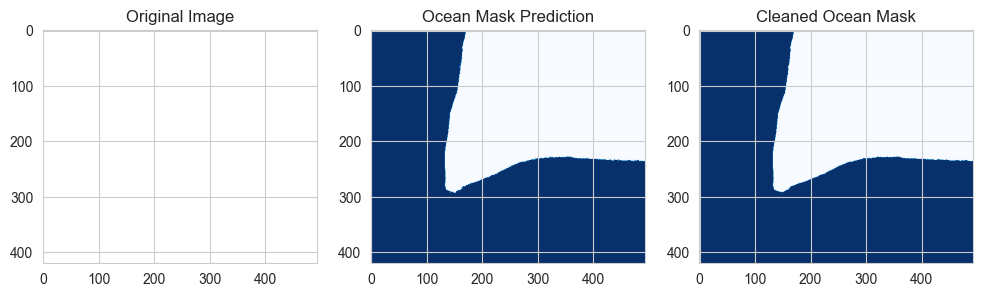

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


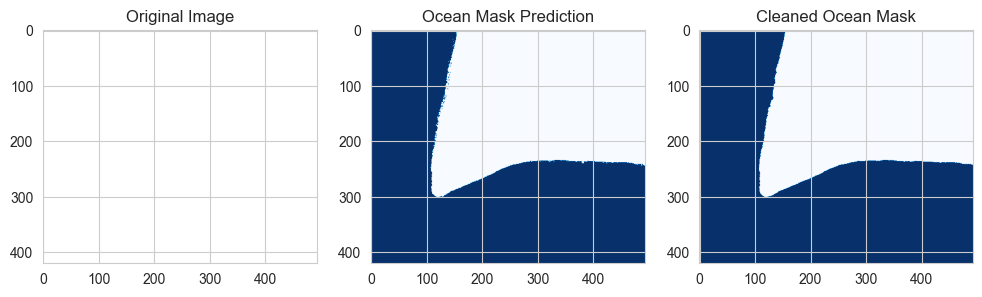

In [20]:


# Post-processing function to remove small isolated regions
def post_process_ocean_mask(mask, min_size=500):
    # Remove small objects (less than min_size pixels)
    cleaned_mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    # Apply morphological closing to smooth boundaries
    cleaned_mask = binary_closing(cleaned_mask, disk(5))
    return cleaned_mask

# Function to predict and plot ocean masks
def plot_ocean_mask(image_path, model):
    with rasterio.open(image_path) as src:
        image = src.read()
        image_reshaped = image.reshape((image.shape[0], -1)).T
        predictions = model.predict(image_reshaped).reshape(image.shape[1], image.shape[2])
        
        # Post-process the ocean mask
        cleaned_predictions = post_process_ocean_mask(predictions)

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        plt.imshow(image.transpose(1, 2, 0)[:,:,:3])  # Display RGB composite
        
        plt.subplot(1, 3, 2)
        plt.title("Ocean Mask Prediction")
        plt.imshow(predictions, cmap='Blues')
        
        plt.subplot(1, 3, 3)
        plt.title("Cleaned Ocean Mask")
        plt.imshow(cleaned_predictions, cmap='Blues')
        
        plt.show()

# Plot predictions for training images
for image_path in image_paths:
    plot_ocean_mask(image_path, model)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


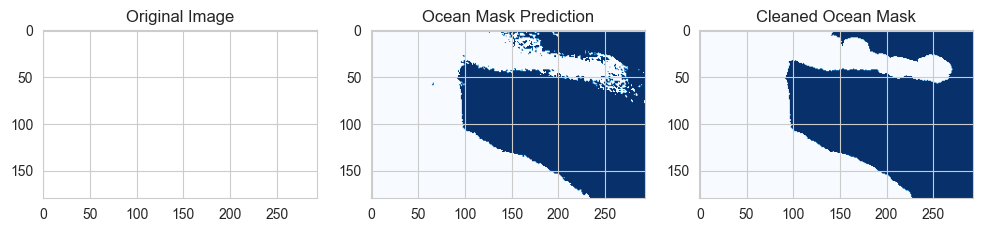

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


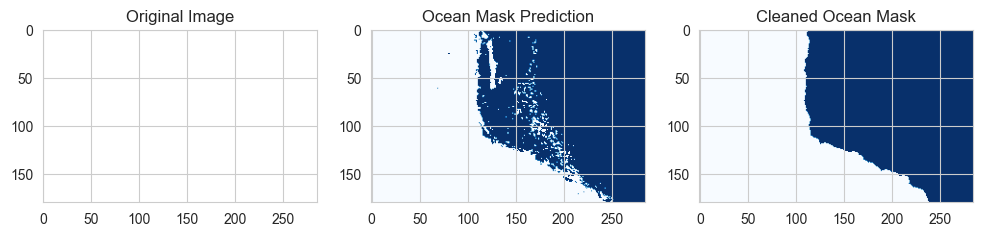

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


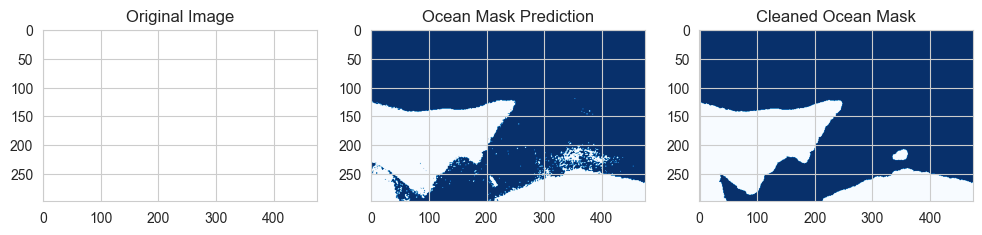

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


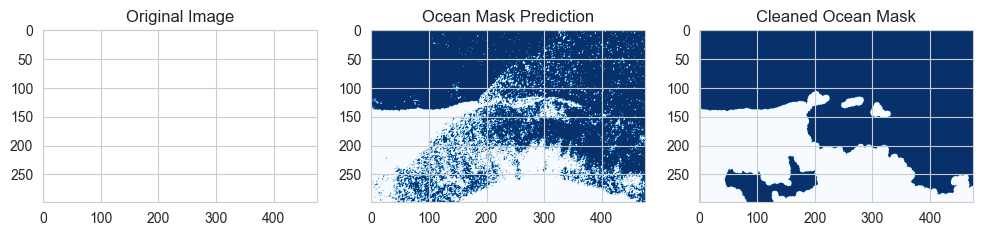

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


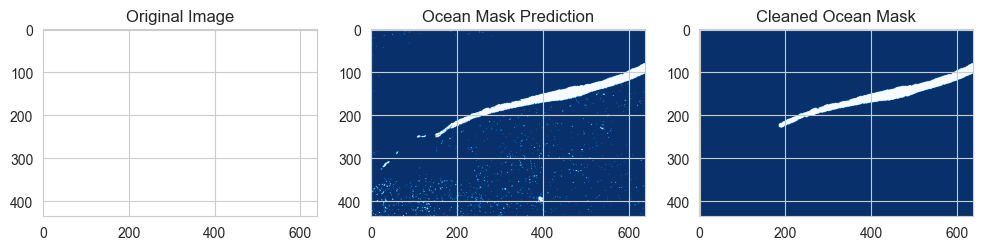

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


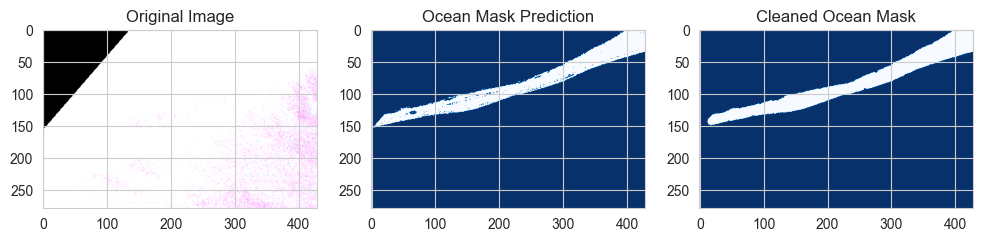

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


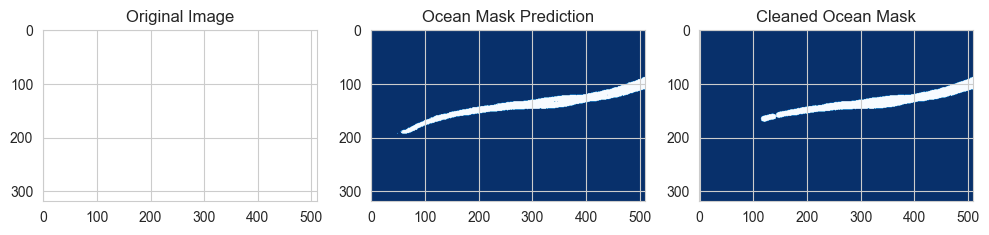

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


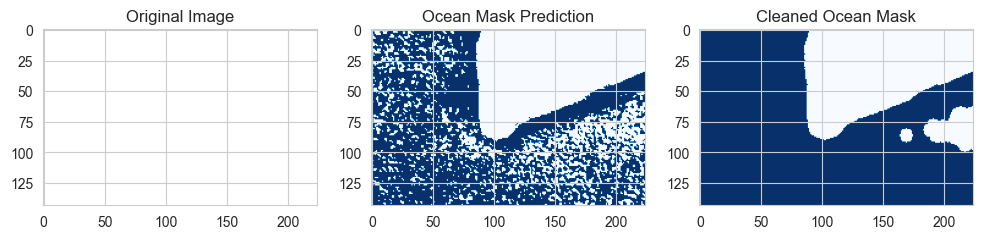

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


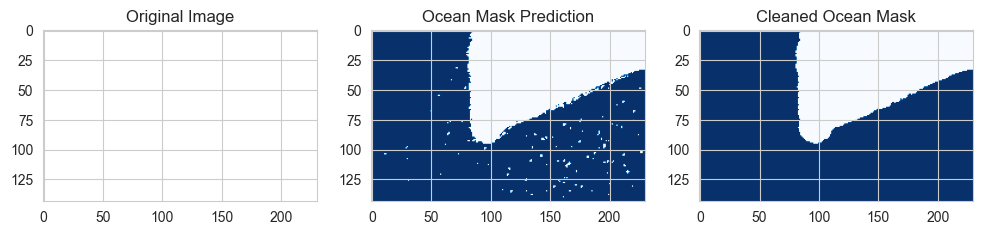

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


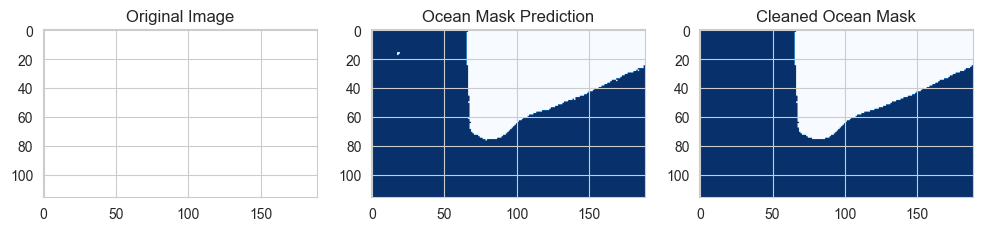

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


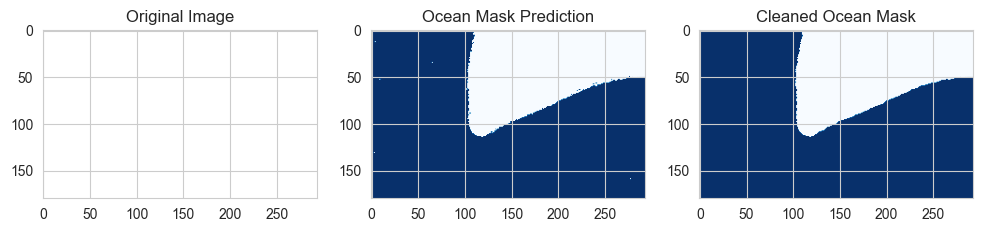

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


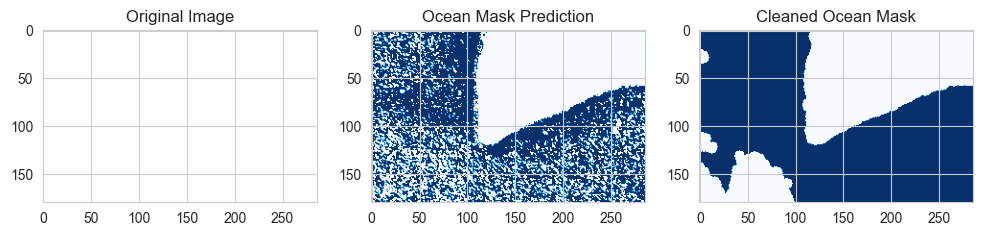

In [21]:
# Plot predictions for unseen images
for image_path in unlabeled_image_paths:
    plot_ocean_mask(image_path, model)


MEMEORY ERROR 

In [7]:
import os
import re
import glob
import numpy as np
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from rasterio.mask import geometry_mask
from skimage.morphology import remove_small_objects, binary_closing, binary_dilation, disk

In [8]:
# Define the directories containing images and shapefiles
image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_images"
shapefile_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_train"
unlabeled_image_dir = "C:\\Users\\Student\\Documents\\101_walrus_data\\train\\clipped_unlabeled"

# Use glob to list all .tif and .shp files in the specified directories
image_paths = glob.glob(f"{image_dir}/*.tif")
shapefile_paths = glob.glob(f"{shapefile_dir}/*.shp")
unlabeled_image_paths = glob.glob(f"{unlabeled_image_dir}/*.tif")

# Function to extract island name and date from file names
def extract_island_and_date(filename):
    pattern = r'([a-zA-Z]+)_(\d{8})'
    match = re.search(pattern, filename)
    if match:
        return match.group(1), match.group(2)
    return None, None

# Pair image and shapefile paths based on filenames
def pair_files(image_paths, shapefile_paths):
    file_pairs = {}
    for image_path in image_paths:
        island, date = extract_island_and_date(os.path.basename(image_path))
        if island is None or date is None:
            print(f"Failed to extract island and date from {image_path}")
            continue

        matching_shapefiles = [shapefile for shapefile in shapefile_paths if island in shapefile and date in shapefile]
        if not matching_shapefiles:
            print(f"No matching shapefile found for {image_path}")
            continue

        shapefile_path = matching_shapefiles[0]
        file_pairs[image_path] = shapefile_path
    return file_pairs

file_pairs = pair_files(image_paths, shapefile_paths)

# Function to extract features and labels
def extract_features_labels(image_path, shapefile_path):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    for _, row in gdf.iterrows():
        mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
        feature_pixels = image[:, mask]
        label = row['label']

        if label == 'ocean':
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Ocean label
        else:
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Non-ocean label

    return np.array(features), np.array(labels)

# Extract features and labels for all image-shapefile pairs
def get_dataset(file_pairs):
    features = []
    labels = []

    for image_path, shapefile_path in file_pairs.items():
        img_features, img_labels = extract_features_labels(image_path, shapefile_path)
        features.append(img_features)
        labels.append(img_labels)

    features = np.vstack(features)
    labels = np.hstack(labels)
    return features, labels

features, labels = get_dataset(file_pairs)

No matching shapefile found for C:\Users\Student\Documents\101_walrus_data\train\clipped_images\pool_20230803_image.tif


In [9]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Train a Random Forest model
ocean_model = RandomForestClassifier(n_estimators=100, random_state=42)
ocean_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [10]:

# Evaluate the model
y_pred = ocean_model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.99750728244344

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     86661
           1       1.00      1.00      1.00    156046

    accuracy                           1.00    242707
   macro avg       1.00      1.00      1.00    242707
weighted avg       1.00      1.00      1.00    242707


Confusion Matrix:
[[ 86471    190]
 [   415 155631]]


In [11]:
# Post-processing function to remove small isolated regions
def post_process_ocean_mask(mask, min_size=500):
    # Remove small objects (less than min_size pixels)
    cleaned_mask = remove_small_objects(mask.astype(bool), min_size=min_size)
    # Apply morphological closing to smooth boundaries
    cleaned_mask = binary_closing(cleaned_mask, disk(5))
    return cleaned_mask

# Function to create ROI around the Ocean Masks
def create_ocean_roi(model, image_paths, buffer_size=50):
    roi_masks = []
    for image_path in image_paths:
        with rasterio.open(image_path) as src:
            image = src.read()
            image_reshaped = image.reshape((image.shape[0], -1)).T
            predictions = model.predict(image_reshaped).reshape(image.shape[1], image.shape[2])
            cleaned_predictions = remove_small_objects(predictions.astype(bool), min_size=500)
            cleaned_predictions = binary_closing(cleaned_predictions, disk(5))
            ocean_buffer = binary_dilation(cleaned_predictions, disk(buffer_size))
            roi_masks.append(ocean_buffer)
    return roi_masks

# Create ROI masks
roi_masks = create_ocean_roi(ocean_model, image_paths)

# Function to extract walrus features within the ROI
def extract_walrus_features(image_path, shapefile_path, roi_mask):
    with rasterio.open(image_path) as src:
        image = src.read()
        transform = src.transform

    gdf = gpd.read_file(shapefile_path)
    features = []
    labels = []

    # Ensure the ROI mask has the same shape as the image
    if roi_mask.shape != (src.height, src.width):
        roi_mask = binary_dilation(roi_mask, disk(roi_mask.shape[0] // 2))

    for _, row in gdf.iterrows():
        if row['label'] in ['walrus_pure', 'walrus_mixed']:
            mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
            feature_pixels = image[:, mask & roi_mask]
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(1)  # Walrus label
        else:
            mask = geometry_mask([row['geometry']], transform=transform, invert=True, out_shape=(src.height, src.width))
            feature_pixels = image[:, mask & roi_mask]
            for pixel in feature_pixels.T:
                features.append(pixel)
                labels.append(0)  # Non-walrus label

    return np.array(features), np.array(labels)

# Extract walrus features within the ROI in batches
def get_walrus_dataset(file_pairs, roi_masks, batch_size=5):
    features = []
    labels = []
    for (image_path, shapefile_path), roi_mask in zip(file_pairs.items(), roi_masks):
        img_features, img_labels = extract_walrus_features(image_path, shapefile_path, roi_mask)
        features.append(img_features)
        labels.append(img_labels)
        # Batch processing
        if len(features) >= batch_size:
            yield np.vstack(features), np.hstack(labels)
            features, labels = [], []

    if features:
        yield np.vstack(features), np.hstack(labels)

# Process walrus dataset in batches to avoid memory issues
walrus_features, walrus_labels = [], []
for batch_features, batch_labels in get_walrus_dataset(file_pairs, roi_masks):
    walrus_features.append(batch_features)
    walrus_labels.append(batch_labels)

walrus_features = np.vstack(walrus_features)
walrus_labels = np.hstack(walrus_labels)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(walrus_features, walrus_labels, test_size=0.2, random_state=42)

MemoryError: 

In [ ]:
# Train a Random Forest model for walrus detection
walrus_model = RandomForestClassifier(n_estimators=100, random_state=42)
walrus_model.fit(X_train, y_train)

# Evaluate the walrus detection model
y_pred = walrus_model.predict(X_test)
print(f"Walrus Detection Accuracy: {accuracy_score(y_test, y_pred)}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

In [ ]:
# Function to predict and plot walrus masks
def plot_walrus_mask(image_path, ocean_model, walrus_model):
    with rasterio.open(image_path) as src:
        image = src.read()
        image_reshaped = image.reshape((image.shape[0], -1)).T
        ocean_predictions = ocean_model.predict(image_reshaped).reshape(image.shape[1], image.shape[2])
        cleaned_ocean_predictions = remove_small_objects(ocean_predictions.astype(bool), min_size=500)
        cleaned_ocean_predictions = binary_closing(cleaned_ocean_predictions, disk(5))
        ocean_buffer = binary_dilation(cleaned_ocean_predictions, disk(50))
        walrus_predictions = walrus_model.predict(image_reshaped).reshape(image.shape[1], image.shape[2]) & ocean_buffer

        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.title("Original Image")
        plt.imshow(image.transpose(1, 2, 0)[:,:,:3])  # Display RGB composite
        
        plt.subplot(1, 3, 2)
        plt.title("Ocean Mask Prediction")
        plt.imshow(cleaned_ocean_predictions, cmap='Blues')
        
        plt.subplot(1, 3, 3)
        plt.title("Walrus Detection")
        plt.imshow(walrus_predictions, cmap='OrRd')
        
        plt.show()

# Plot predictions for training images
for image_path in image_paths:
    plot_walrus_mask(image_path, ocean_model, walrus_model)

In [ ]:



# Plot predictions for unseen images
for image_path in unlabeled_image_paths:
    plot_walrus_mask(image_path, ocean_model, walrus_model)
